In [1]:
!pip install -r ../requirements.txt

# Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from matplotlib import animation
from IPython import display

import torch
import torch.nn as nn
import torch.optim as optim
from torch import Tensor
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
from torch.utils.data import DataLoader

from torchsummary import summary

from tqdm import tqdm

from torchvision.models import efficientnet_v2_s


In [3]:
if not os.path.exists("checkpoints"):
    os.mkdir("checkpoints")

In [4]:
data_dir: str = '/media/jychpr/ADATA SD810/kaggle_data/google-research-identify-contrails-reduce-global-warming'

In [5]:
df_train_idx = pd.DataFrame({'idx': os.listdir(os.path.join(data_dir, 'train'))})
df_validation_idx = pd.DataFrame({'idx': os.listdir(os.path.join(data_dir, 'validation'))})
df_test_idx = pd.DataFrame({'idx': os.listdir(os.path.join(data_dir, 'test'))})

In [6]:
def get_band_images(idx: str, parrent_folder: str, band: str) -> np.array:
    return np.load(os.path.join(data_dir, parrent_folder, idx, f'band_{band}.npy'))

In [7]:
_T11_BOUNDS = (243, 303)
_CLOUD_TOP_TDIFF_BOUNDS = (-4, 5)
_TDIFF_BOUNDS = (-4, 2)

def normalize_range(data, bounds):
    """Maps data to the range [0, 1]."""
    return (data - bounds[0]) / (bounds[1] - bounds[0])


def get_ash_color_images(idx: str, parrent_folder: str, get_mask_frame_only=False) -> np.array:
    band11 = get_band_images(idx, parrent_folder, '11')
    band14 = get_band_images(idx, parrent_folder, '14')
    band15 = get_band_images(idx, parrent_folder, '15')
    
    if get_mask_frame_only:
        band11 = band11[:,:,4]
        band14 = band14[:,:,4]
        band15 = band15[:,:,4]

    r = normalize_range(band15 - band14, _TDIFF_BOUNDS)
    g = normalize_range(band14 - band11, _CLOUD_TOP_TDIFF_BOUNDS)
    b = normalize_range(band14, _T11_BOUNDS)
    false_color = np.clip(np.stack([r, g, b], axis=2), 0, 1)
    return false_color

In [8]:
def get_mask_image(idx: str, parrent_folder: str) -> np.array:
    return np.load(os.path.join(data_dir, parrent_folder, idx, 'human_pixel_masks.npy')) 

# EDA

In [9]:
train_images_with_contrails = 0
train_images_without_contrails = 0
train_contrail_pixel_count = 0
train_non_contrail_pixel_count = 0
train_contrail_pixel_count_conly = 0
train_non_contrail_pixel_count_conly = 0
img_pixel_count = 256 * 256

for idx in df_train_idx['idx']:
    mask = get_mask_image(idx, 'train')
    contrail_pixel_count = np.sum(mask > 0)
    
    if contrail_pixel_count > 0:
        train_images_with_contrails += 1
        train_contrail_pixel_count_conly += contrail_pixel_count
        train_non_contrail_pixel_count_conly += (img_pixel_count - contrail_pixel_count)
    else:
        train_images_without_contrails += 1
        
    train_contrail_pixel_count += contrail_pixel_count
    train_non_contrail_pixel_count += (img_pixel_count - contrail_pixel_count)

In [10]:
validation_images_with_contrails = 0
validation_images_without_contrails = 0
validation_contrail_pixel_count = 0
validation_non_contrail_pixel_count = 0
validation_contrail_pixel_count_conly = 0
validation_non_contrail_pixel_count_conly = 0
img_pixel_count = 256 * 256

for idx in df_validation_idx['idx']:
    mask = get_mask_image(idx, 'validation')
    contrail_pixel_count = np.sum(mask > 0)
    
    if contrail_pixel_count > 0:
        validation_images_with_contrails += 1
        validation_contrail_pixel_count_conly += contrail_pixel_count
        validation_non_contrail_pixel_count_conly += (img_pixel_count - contrail_pixel_count)
    else:
        validation_images_without_contrails += 1
        
    validation_contrail_pixel_count += contrail_pixel_count
    validation_non_contrail_pixel_count += (img_pixel_count - contrail_pixel_count)

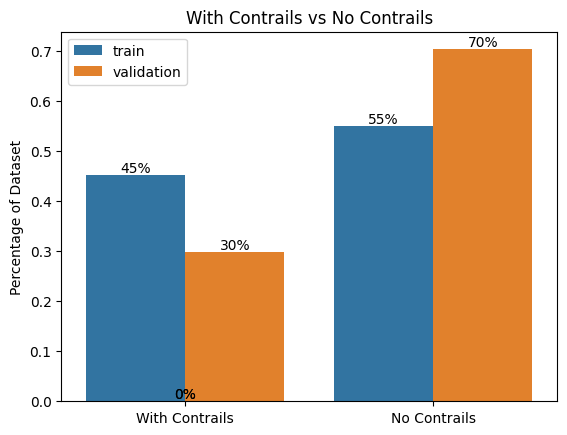

In [11]:
train_with_contrails = train_images_with_contrails / (train_images_with_contrails + train_images_without_contrails)
train_without_contrails = train_images_without_contrails / (train_images_with_contrails + train_images_without_contrails)
validation_with_contrails = validation_images_with_contrails / (validation_images_with_contrails + validation_images_without_contrails)
validation_without_contrails = validation_images_without_contrails / (validation_images_with_contrails + validation_images_without_contrails)
data = pd.DataFrame({'Type': ['With Contrails', 'No Contrails', 'With Contrails', 'No Contrails'],
        'Data': [train_with_contrails, train_without_contrails, validation_with_contrails, validation_without_contrails],
        'Data Set': ['train', 'train', 'validation', 'validation']})

ax = sns.barplot(data=data, y='Data', x="Type", hue="Data Set", orient='v')

for p in ax.patches:
    ax.annotate(format(p.get_height() * 100, '.0f') + '%',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 5),
                textcoords = 'offset points')
    
ax.set_xlabel('')
ax.set_ylabel('Percentage of Dataset')
ax.set_title('With Contrails vs No Contrails')

plt.legend()
plt.show()

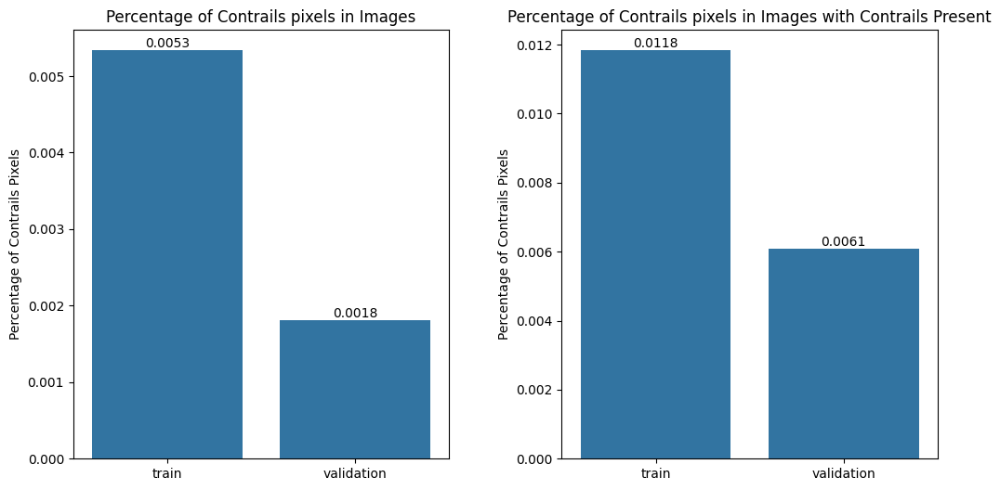

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
fig.subplots_adjust(wspace=0.3)
axes = axes.flatten()

train_with_contrails_pix = train_contrail_pixel_count / (train_contrail_pixel_count + train_non_contrail_pixel_count)
validation_with_contrails_pix = validation_contrail_pixel_count / (validation_contrail_pixel_count + validation_non_contrail_pixel_count)
data = pd.DataFrame({'Data': [train_with_contrails_pix, validation_with_contrails_pix],
        'Data Set': ['train', 'validation']})
sns.barplot(data=data, y='Data', x="Data Set", orient='v', ax=axes[0])
for p in axes[0].patches:
    axes[0].annotate(format(p.get_height(), '.4f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 5),
                textcoords = 'offset points')
axes[0].set_xlabel('')
axes[0].set_ylabel('Percentage of Contrails Pixels')
axes[0].set_title('Percentage of Contrails pixels in Images')

train_with_contrails_pix_conly = train_contrail_pixel_count_conly / (train_contrail_pixel_count_conly + train_non_contrail_pixel_count_conly)
validation_with_contrails_pix_conly = validation_contrail_pixel_count_conly / (validation_contrail_pixel_count_conly + validation_non_contrail_pixel_count_conly)
data = pd.DataFrame({'Data': [train_with_contrails_pix_conly, validation_with_contrails_pix_conly],
        'Data Set': ['train', 'validation']})
sns.barplot(data=data, y='Data', x="Data Set", orient='v', ax=axes[1])
for p in axes[1].patches:
    axes[1].annotate(format(p.get_height(), '.4f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 5),
                textcoords = 'offset points')
axes[1].set_xlabel('')
axes[1].set_ylabel('Percentage of Contrails Pixels')
axes[1].set_title('Percentage of Contrails pixels in Images with Contrails Present')

plt.show()

In [13]:
def show_band_images(idx: str, parrent_folder: str, band: str):
    data = get_band_images(idx, parrent_folder, band)
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
    axes = axes.flatten()
    for i in range(8):
        axes[i].imshow(data[:,:,i])
        axes[i].axis('off')
    plt.show()

def show_ash_images(idx: str, parrent_folder: str):
    data = get_ash_color_images(idx, parrent_folder)
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
    axes = axes.flatten()
    for i in range(8):
        axes[i].imshow(data[:,:,:,i])
        axes[i].axis('off')
    plt.show()

def show_ash_frame(idx: str, parrent_folder: str, frame: int):
    data = get_ash_color_images(idx, parrent_folder)
    plt.imshow(data[:,:,:,frame])
    plt.show()
    
def show_mask_image(idx: str, parrent_folder: str):
    plt.imshow(get_mask_image(idx, parrent_folder))
    plt.show()

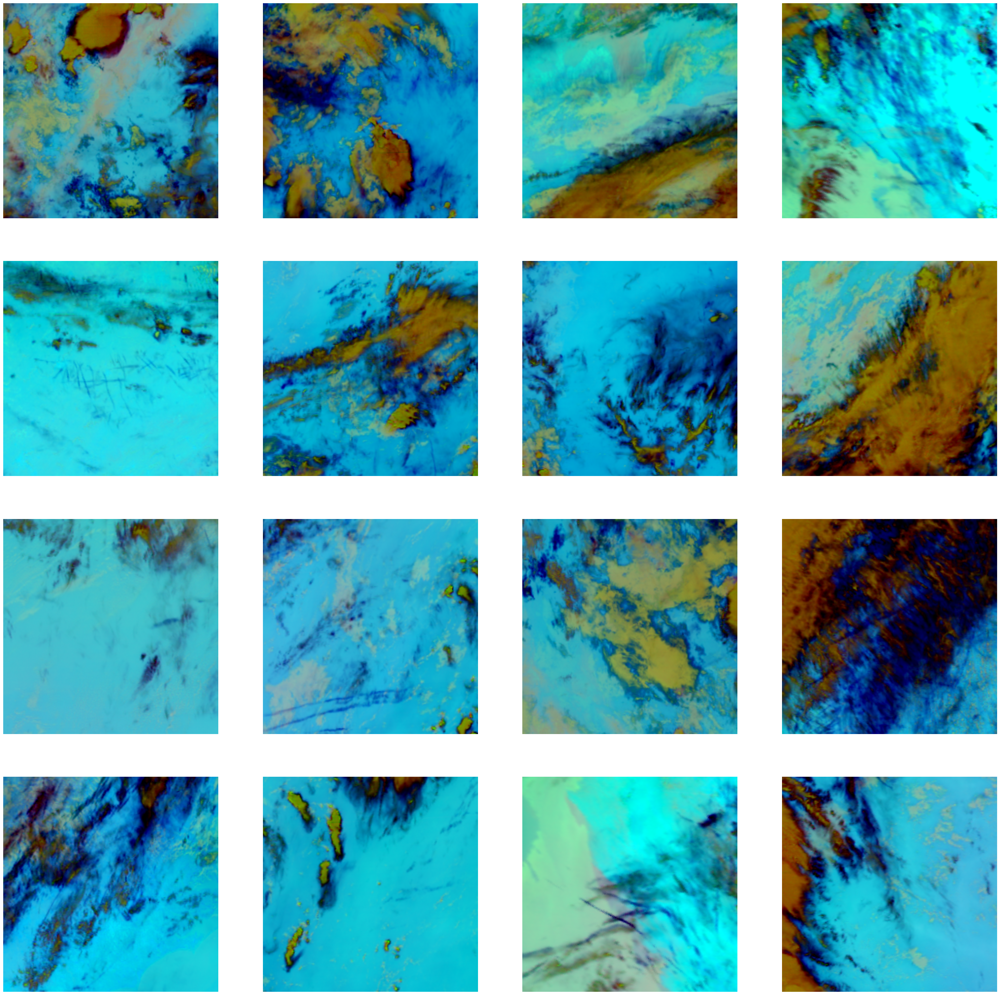

In [14]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(40, 40))
axes = axes.flatten()

for i in range(len(axes)):
    images = get_ash_color_images(str(df_train_idx.iloc[730 + i]['idx']), 'train')
    axes[i].imshow(images[:,:,:,4])
    axes[i].axis('off')

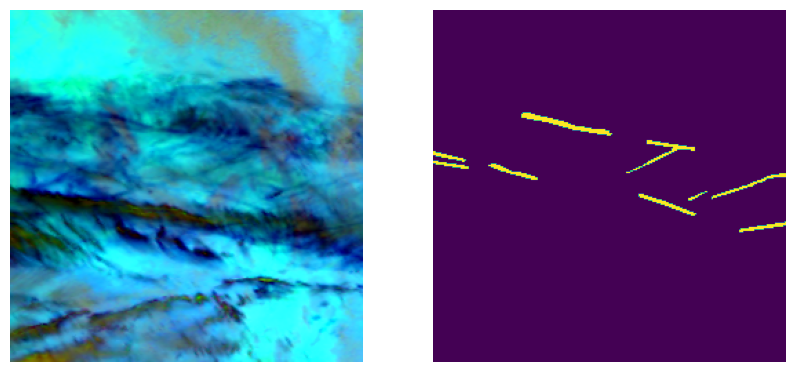

In [15]:
images = get_ash_color_images(str(df_train_idx.iloc[683]['idx']), 'train')
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axes = axes.flatten()

axes[0].imshow(images[:,:,:,4])
axes[0].axis('off')
axes[1].imshow(get_mask_image(str(df_train_idx.iloc[683]['idx']), 'train'))
axes[1].axis('off')

plt.show()

# Model

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [17]:
# Loss function combining BCE and Dice
def dice_loss(pred, target, smooth=1e-6):
    pred = pred.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = (pred * target).sum()
    total = pred.sum() + target.sum()
    dice = (2. * intersection + smooth) / (total + smooth)
    return 1 - dice

def composite_loss(pred, target):
    bce = nn.BCEWithLogitsLoss()(pred, target)
    dice = dice_loss(torch.sigmoid(pred), target)
    return 0.5 * bce + 0.5 * dice

# Generate soft labels by averaging multiple annotations
def generate_soft_labels(annotations):
    return torch.mean(torch.stack(annotations), dim=0)

class EfficientNetV2SEncoder(nn.Module):
    def __init__(self, in_channels=24, pretrained=True):
        super(EfficientNetV2SEncoder, self).__init__()
        backbone = efficientnet_v2_s(weights='DEFAULT' if pretrained else None)
        layers = list(backbone.features.children())
        
        # Modify the first convolutional layer to accept in_channels
        first_conv = layers[0][0]  # First Conv2d layer in the backbone
        new_first_conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=first_conv.out_channels,
            kernel_size=first_conv.kernel_size,
            stride=first_conv.stride,
            padding=first_conv.padding,
            bias=first_conv.bias is not None
        )
        layers[0][0] = new_first_conv  # Replace the first Conv2d layer
        
        self.stages = nn.ModuleList([
            nn.Sequential(*layers[:2]),   # Stage 0
            nn.Sequential(*layers[2:4]), # Stage 1
            nn.Sequential(*layers[4:6]), # Stage 2
            nn.Sequential(*layers[6:8]), # Stage 3
            nn.Sequential(*layers[8:]),  # Stage 4
        ])
        
        self.out_channels = [24, 48, 64, 160, 256]

    def forward(self, x):
        features = []
        for i, stage in enumerate(self.stages):
            x = stage(x)
            # print(f"Output of stage {i}: {x.shape}")  # Debugging
            features.append(x)
        return features



class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x1, x2):
        x1 = self.up(x1)

        # Handle padding in case of odd-sized inputs
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2,
                                     diffY // 2, diffY - diffY // 2])

        # Concatenate and pass through conv layers
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class EfficientNetV2SUNet(nn.Module):
    def __init__(self, num_classes=1, in_channels=24, pretrained=True):
        super(EfficientNetV2SUNet, self).__init__()
        self.encoder = EfficientNetV2SEncoder(in_channels=in_channels, pretrained=pretrained)

        # Updated encoder output channels based on EfficientNetV2-S
        encoder_out_channels = [24, 64, 160, 1280, 1280]  # Match encoder outputs

        # Decoder
        self.up1 = Up(encoder_out_channels[-1] + encoder_out_channels[-2], 256)
        self.up2 = Up(256 + encoder_out_channels[-3], 128)
        self.up3 = Up(128 + encoder_out_channels[-4], 64)
        self.up4 = Up(64 + encoder_out_channels[-5], 32)

        # Final conv
        self.final_conv = nn.Conv2d(32, num_classes, kernel_size=1)

        # Final upsampling
        self.final_upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        enc_features = self.encoder(x)
        x5 = enc_features[-1]
        x4 = enc_features[-2]
        x3 = enc_features[-3]
        x2 = enc_features[-4]
        x1 = enc_features[-5]

        x = self.up1(x5, x4)
        # print(f"Shape after up1: {x.shape}")  # Debugging
        x = self.up2(x, x3)
        # print(f"Shape after up2: {x.shape}")  # Debugging
        x = self.up3(x, x2)
        # print(f"Shape after up3: {x.shape}")  # Debugging
        x = self.up4(x, x1)
        # print(f"Shape after up4: {x.shape}")  # Debugging

        x = self.final_conv(x)
        # print(f"Shape after final_conv: {x.shape}")  # Debugging

        x = self.final_upsample(x)
        # print(f"Final output shape: {x.shape}")  # Debugging

        return x


# Trainer

In [18]:
class Dice(nn.Module):
    def __init__(self, use_sigmoid=True):
        super(Dice, self).__init__()
        self.sigmoid = nn.Sigmoid()
        self.use_sigmoid = use_sigmoid

    def forward(self, inputs, targets, smooth=1):
        if self.use_sigmoid:
            inputs = self.sigmoid(inputs)       
        
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()
        dice = (2.0 *intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return dice
    
dice = Dice()

In [19]:
class MyTrainer:
    def __init__(self, model, optimizer, loss_fn, lr_scheduler):
        self.validation_losses = []
        self.batch_losses = []
        self.epoch_losses = []
        self.learning_rates = []
        self.model = model
        self.optimizer = optimizer
        self.loss_fn = loss_fn
        self.lr_scheduler = lr_scheduler
        self._check_optim_net_aligned()

    # Ensures that the given optimizer points to the given model
    def _check_optim_net_aligned(self):
        assert self.optimizer.param_groups[0]['params'] == list(self.model.parameters())

    # Trains the model
    def fit(self,
            train_dataloader: DataLoader,
            test_dataloader: DataLoader,
            epochs: int = 10,
            eval_every: int = 1,
            ):
  
        for e in range(epochs):
            print("New learning rate: {}".format(self.lr_scheduler.get_last_lr()))
            self.learning_rates.append(self.lr_scheduler.get_last_lr()[0])

            # Stores data about the batch
            batch_losses = []
            sub_batch_losses = []

            for i, data in enumerate(tqdm(train_dataloader, desc=f"Epoch {e + 1}/{epochs} Training")):
                self.model.train()
                if i % 100 == 0:
                    print(f'epotch: {e} batch: {i}/{len(train_dataloader)} loss: {torch.Tensor(sub_batch_losses).mean()}')
                    sub_batch_losses.clear()
                # Every data instance is an input + label pair
                images, mask = data
                
                if torch.cuda.is_available():
                    images = images.cuda()
                    mask = mask.cuda()

                # Zero your gradients for every batch!
                self.optimizer.zero_grad()
                # Make predictions for this batch
                outputs = self.model(images)
                # Compute the loss and its gradients
                loss = self.loss_fn(outputs, mask)
                loss.backward()
                # Adjust learning weights
                self.optimizer.step()

                # Saves data
                self.batch_losses.append(loss.item())
                batch_losses.append(loss)
                sub_batch_losses.append(loss)

            # Adjusts learning rate
            if self.lr_scheduler is not None:
                self.lr_scheduler.step()

            # Reports on the path
            mean_epoch_loss = torch.Tensor(batch_losses).mean()
            self.epoch_losses.append(mean_epoch_loss.item())
            print('Train Epoch: {} Average Loss: {:.6f}'.format(e, mean_epoch_loss))

            # Reports on the training progress
            if (e + 1) % eval_every == 0:
                torch.save(self.model.state_dict(), "checkpoints/" + type(self.model).__name__ + "_model_checkpoint_e" + str(e) + ".pt")
                with torch.no_grad():
                    self.model.eval()
                    losses = []
                    for i, data in enumerate(tqdm(test_dataloader, desc=f"Epoch {e + 1}/{epochs} Validation")):
                        # Every data instance is an input + label pair
                        images, mask = data

                        if torch.cuda.is_available():
                            images = images.cuda()
                            mask = mask.cuda()

                        output = self.model(images)
                        loss = self.loss_fn(output, mask)
                        losses.append(loss.item())
                        
                    avg_loss = torch.Tensor(losses).mean().item()
                    self.validation_losses.append(avg_loss)
                    print("Validation loss after", (e + 1), "epochs was", round(avg_loss, 4))

# Dataset

In [20]:
class ContrailsAshDataset(torch.utils.data.Dataset):
    def __init__(self, parrent_folder: str):
        self.df_idx: pd.DataFrame = pd.DataFrame({'idx': os.listdir(f'/media/jychpr/ADATA SD810/kaggle_data/google-research-identify-contrails-reduce-global-warming/{parrent_folder}')})
        self.parrent_folder: str = parrent_folder

    def __len__(self):
        return len(self.df_idx)

    def __getitem__(self, idx):
        image_id: str = str(self.df_idx.iloc[idx]['idx'])
        images = torch.tensor(np.reshape(get_ash_color_images(image_id, self.parrent_folder, get_mask_frame_only=False), (256, 256, 24))).to(torch.float32).permute(2, 0, 1)
        mask = torch.tensor(get_mask_image(image_id, self.parrent_folder)).to(torch.float32).permute(2, 0, 1)
        return images, mask

In [21]:
dataset_train = ContrailsAshDataset('train')
dataset_validation = ContrailsAshDataset('validation')

data_loader_train = DataLoader(dataset_train, batch_size=8, shuffle=True, num_workers=2)
data_loader_validation = DataLoader(dataset_validation, batch_size=8, shuffle=True, num_workers=2)

# Train

In [22]:
train = True

In [23]:
if train:
    model = EfficientNetV2SUNet(num_classes=1, in_channels=24, pretrained=True)
    model.to(device)

    criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(100))
    optimizer = optim.Adam(model.parameters(), lr=0.01)
    lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, 0.70)

    num_epochs = 10

    trainer = MyTrainer(model, optimizer, criterion, lr_scheduler)
    trainer.fit(data_loader_train, data_loader_validation, epochs=num_epochs)


New learning rate: [0.01]


Epoch 1/10 Training:   0%|                             | 0/2567 [00:00<?, ?it/s]

epotch: 0 batch: 0/2567 loss: nan


Epoch 1/10 Training:   4%|▋                  | 101/2567 [00:10<03:41, 11.14it/s]

epotch: 0 batch: 100/2567 loss: 5.465865612030029


Epoch 1/10 Training:   8%|█▍                 | 201/2567 [00:19<03:40, 10.73it/s]

epotch: 0 batch: 200/2567 loss: 1.0101875066757202


Epoch 1/10 Training:  12%|██▏                | 301/2567 [00:28<03:28, 10.87it/s]

epotch: 0 batch: 300/2567 loss: 0.9558590054512024


Epoch 1/10 Training:  16%|██▉                | 401/2567 [00:37<03:22, 10.68it/s]

epotch: 0 batch: 400/2567 loss: 0.9338825941085815


Epoch 1/10 Training:  20%|███▋               | 501/2567 [00:47<03:13, 10.66it/s]

epotch: 0 batch: 500/2567 loss: 0.9275580048561096


Epoch 1/10 Training:  23%|████▍              | 601/2567 [00:56<03:05, 10.61it/s]

epotch: 0 batch: 600/2567 loss: 1.024324893951416


Epoch 1/10 Training:  27%|█████▏             | 701/2567 [01:05<03:04, 10.09it/s]

epotch: 0 batch: 700/2567 loss: 0.9834783673286438


Epoch 1/10 Training:  31%|█████▉             | 801/2567 [01:15<02:36, 11.27it/s]

epotch: 0 batch: 800/2567 loss: 0.9581083655357361


Epoch 1/10 Training:  35%|██████▋            | 901/2567 [01:24<02:28, 11.24it/s]

epotch: 0 batch: 900/2567 loss: 0.991230845451355


Epoch 1/10 Training:  39%|███████           | 1001/2567 [01:34<02:32, 10.26it/s]

epotch: 0 batch: 1000/2567 loss: 1.0025557279586792


Epoch 1/10 Training:  43%|███████▋          | 1101/2567 [01:44<02:32,  9.63it/s]

epotch: 0 batch: 1100/2567 loss: 0.926918625831604


Epoch 1/10 Training:  47%|████████▍         | 1202/2567 [01:54<02:07, 10.72it/s]

epotch: 0 batch: 1200/2567 loss: 0.9835227131843567


Epoch 1/10 Training:  51%|█████████         | 1301/2567 [02:03<02:00, 10.53it/s]

epotch: 0 batch: 1300/2567 loss: 1.1013877391815186


Epoch 1/10 Training:  55%|█████████▊        | 1401/2567 [02:13<01:51, 10.43it/s]

epotch: 0 batch: 1400/2567 loss: 1.0056053400039673


Epoch 1/10 Training:  58%|██████████▌       | 1501/2567 [02:22<01:33, 11.41it/s]

epotch: 0 batch: 1500/2567 loss: 1.0201773643493652


Epoch 1/10 Training:  62%|███████████▏      | 1601/2567 [02:32<01:31, 10.52it/s]

epotch: 0 batch: 1600/2567 loss: 0.9168746471405029


Epoch 1/10 Training:  66%|███████████▉      | 1701/2567 [02:41<01:22, 10.46it/s]

epotch: 0 batch: 1700/2567 loss: 0.9815618991851807


Epoch 1/10 Training:  70%|████████████▋     | 1801/2567 [02:51<01:12, 10.56it/s]

epotch: 0 batch: 1800/2567 loss: 0.968299925327301


Epoch 1/10 Training:  74%|█████████████▎    | 1901/2567 [03:00<01:03, 10.45it/s]

epotch: 0 batch: 1900/2567 loss: 0.9850852489471436


Epoch 1/10 Training:  78%|██████████████    | 2001/2567 [03:09<00:55, 10.13it/s]

epotch: 0 batch: 2000/2567 loss: 1.006331443786621


Epoch 1/10 Training:  82%|██████████████▋   | 2101/2567 [03:19<00:44, 10.56it/s]

epotch: 0 batch: 2100/2567 loss: 1.00038480758667


Epoch 1/10 Training:  86%|███████████████▍  | 2201/2567 [03:28<00:34, 10.61it/s]

epotch: 0 batch: 2200/2567 loss: 1.040511965751648


Epoch 1/10 Training:  90%|████████████████▏ | 2301/2567 [03:37<00:25, 10.53it/s]

epotch: 0 batch: 2300/2567 loss: 1.035229206085205


Epoch 1/10 Training:  94%|████████████████▊ | 2401/2567 [03:47<00:15, 10.65it/s]

epotch: 0 batch: 2400/2567 loss: 1.0260435342788696


Epoch 1/10 Training:  97%|█████████████████▌| 2501/2567 [03:56<00:06, 10.66it/s]

epotch: 0 batch: 2500/2567 loss: 0.9325920939445496


Epoch 1/10 Training: 100%|██████████████████| 2567/2567 [04:03<00:00, 10.55it/s]


Train Epoch: 0 Average Loss: 1.162780


Epoch 1/10 Validation: 100%|██████████████████| 232/232 [00:22<00:00, 10.11it/s]


Validation loss after 1 epochs was 0.6183
New learning rate: [0.006999999999999999]


Epoch 2/10 Training:   0%|                     | 1/2567 [00:00<13:36,  3.14it/s]

epotch: 1 batch: 0/2567 loss: nan


Epoch 2/10 Training:   4%|▋                  | 101/2567 [00:09<03:52, 10.63it/s]

epotch: 1 batch: 100/2567 loss: 0.9897443652153015


Epoch 2/10 Training:   8%|█▍                 | 201/2567 [00:18<03:26, 11.48it/s]

epotch: 1 batch: 200/2567 loss: 1.0532797574996948


Epoch 2/10 Training:  12%|██▏                | 301/2567 [00:28<03:39, 10.31it/s]

epotch: 1 batch: 300/2567 loss: 0.9551998972892761


Epoch 2/10 Training:  16%|██▉                | 401/2567 [00:37<03:26, 10.51it/s]

epotch: 1 batch: 400/2567 loss: 0.9833493828773499


Epoch 2/10 Training:  20%|███▋               | 501/2567 [00:46<03:15, 10.55it/s]

epotch: 1 batch: 500/2567 loss: 0.9716134071350098


Epoch 2/10 Training:  23%|████▍              | 601/2567 [00:56<03:06, 10.54it/s]

epotch: 1 batch: 600/2567 loss: 1.0187807083129883


Epoch 2/10 Training:  27%|█████▏             | 701/2567 [01:05<02:58, 10.46it/s]

epotch: 1 batch: 700/2567 loss: 0.9394455552101135


Epoch 2/10 Training:  31%|█████▉             | 801/2567 [01:14<02:47, 10.53it/s]

epotch: 1 batch: 800/2567 loss: 0.997548520565033


Epoch 2/10 Training:  35%|██████▋            | 901/2567 [01:24<02:35, 10.72it/s]

epotch: 1 batch: 900/2567 loss: 0.9476670622825623


Epoch 2/10 Training:  39%|███████           | 1001/2567 [01:33<02:25, 10.76it/s]

epotch: 1 batch: 1000/2567 loss: 1.0128047466278076


Epoch 2/10 Training:  43%|███████▋          | 1101/2567 [01:42<02:15, 10.79it/s]

epotch: 1 batch: 1100/2567 loss: 0.9593679308891296


Epoch 2/10 Training:  47%|████████▍         | 1201/2567 [01:52<02:05, 10.93it/s]

epotch: 1 batch: 1200/2567 loss: 0.9948794841766357


Epoch 2/10 Training:  51%|█████████         | 1301/2567 [02:01<01:55, 10.98it/s]

epotch: 1 batch: 1300/2567 loss: 1.0060778856277466


Epoch 2/10 Training:  55%|█████████▊        | 1401/2567 [02:11<01:43, 11.28it/s]

epotch: 1 batch: 1400/2567 loss: 1.0680357217788696


Epoch 2/10 Training:  58%|██████████▌       | 1501/2567 [02:20<01:42, 10.39it/s]

epotch: 1 batch: 1500/2567 loss: 0.9771603941917419


Epoch 2/10 Training:  62%|███████████▏      | 1602/2567 [02:30<01:35, 10.10it/s]

epotch: 1 batch: 1600/2567 loss: 0.9945719838142395


Epoch 2/10 Training:  66%|███████████▉      | 1700/2567 [02:40<01:26, 10.04it/s]

epotch: 1 batch: 1700/2567 loss: 0.9957853555679321


Epoch 2/10 Training:  70%|████████████▋     | 1802/2567 [02:50<01:17,  9.87it/s]

epotch: 1 batch: 1800/2567 loss: 0.9772236347198486


Epoch 2/10 Training:  74%|█████████████▎    | 1901/2567 [02:59<01:06,  9.95it/s]

epotch: 1 batch: 1900/2567 loss: 0.9555432796478271


Epoch 2/10 Training:  78%|██████████████    | 2001/2567 [03:09<00:55, 10.21it/s]

epotch: 1 batch: 2000/2567 loss: 0.981627345085144


Epoch 2/10 Training:  82%|██████████████▋   | 2102/2567 [03:20<00:47,  9.76it/s]

epotch: 1 batch: 2100/2567 loss: 1.0204861164093018


Epoch 2/10 Training:  86%|███████████████▍  | 2202/2567 [03:30<00:39,  9.24it/s]

epotch: 1 batch: 2200/2567 loss: 1.0519832372665405


Epoch 2/10 Training:  90%|████████████████▏ | 2301/2567 [03:41<00:30,  8.76it/s]

epotch: 1 batch: 2300/2567 loss: 0.9283689856529236


Epoch 2/10 Training:  94%|████████████████▊ | 2401/2567 [03:52<00:18,  8.77it/s]

epotch: 1 batch: 2400/2567 loss: 0.9812273979187012


Epoch 2/10 Training:  97%|█████████████████▌| 2501/2567 [04:03<00:07,  8.83it/s]

epotch: 1 batch: 2500/2567 loss: 1.0164287090301514


Epoch 2/10 Training: 100%|██████████████████| 2567/2567 [04:11<00:00, 10.21it/s]


Train Epoch: 1 Average Loss: 0.989300


Epoch 2/10 Validation: 100%|██████████████████| 232/232 [00:16<00:00, 14.14it/s]


Validation loss after 2 epochs was 0.6119
New learning rate: [0.004899999999999999]


Epoch 3/10 Training:   0%|                     | 1/2567 [00:00<14:28,  2.95it/s]

epotch: 2 batch: 0/2567 loss: nan


Epoch 3/10 Training:   4%|▋                  | 101/2567 [00:09<03:56, 10.44it/s]

epotch: 2 batch: 100/2567 loss: 0.9595585465431213


Epoch 3/10 Training:   8%|█▍                 | 201/2567 [00:19<03:43, 10.59it/s]

epotch: 2 batch: 200/2567 loss: 0.9624345898628235


Epoch 3/10 Training:  12%|██▏                | 301/2567 [00:28<03:34, 10.58it/s]

epotch: 2 batch: 300/2567 loss: 0.9878073334693909


Epoch 3/10 Training:  16%|██▉                | 401/2567 [00:37<03:27, 10.43it/s]

epotch: 2 batch: 400/2567 loss: 0.9625800848007202


Epoch 3/10 Training:  20%|███▋               | 501/2567 [00:47<03:18, 10.42it/s]

epotch: 2 batch: 500/2567 loss: 1.040836215019226


Epoch 3/10 Training:  23%|████▍              | 601/2567 [00:56<03:06, 10.52it/s]

epotch: 2 batch: 600/2567 loss: 1.021684169769287


Epoch 3/10 Training:  27%|█████▏             | 701/2567 [01:06<02:58, 10.46it/s]

epotch: 2 batch: 700/2567 loss: 1.0684751272201538


Epoch 3/10 Training:  31%|█████▉             | 801/2567 [01:15<02:42, 10.88it/s]

epotch: 2 batch: 800/2567 loss: 0.9798787832260132


Epoch 3/10 Training:  35%|██████▋            | 901/2567 [01:24<02:40, 10.37it/s]

epotch: 2 batch: 900/2567 loss: 0.951836109161377


Epoch 3/10 Training:  39%|███████           | 1001/2567 [01:34<02:31, 10.37it/s]

epotch: 2 batch: 1000/2567 loss: 0.9427720904350281


Epoch 3/10 Training:  43%|███████▋          | 1102/2567 [01:44<02:12, 11.07it/s]

epotch: 2 batch: 1100/2567 loss: 1.0158028602600098


Epoch 3/10 Training:  47%|████████▍         | 1202/2567 [01:54<02:24,  9.46it/s]

epotch: 2 batch: 1200/2567 loss: 1.0310214757919312


Epoch 3/10 Training:  51%|█████████▏        | 1302/2567 [02:04<02:07,  9.94it/s]

epotch: 2 batch: 1300/2567 loss: 0.9099075198173523


Epoch 3/10 Training:  55%|█████████▊        | 1402/2567 [02:14<02:00,  9.67it/s]

epotch: 2 batch: 1400/2567 loss: 0.9582411050796509


Epoch 3/10 Training:  58%|██████████▌       | 1500/2567 [02:24<01:44, 10.19it/s]

epotch: 2 batch: 1500/2567 loss: 1.0273871421813965


Epoch 3/10 Training:  62%|███████████▏      | 1602/2567 [02:34<01:34, 10.19it/s]

epotch: 2 batch: 1600/2567 loss: 0.989529550075531


Epoch 3/10 Training:  66%|███████████▉      | 1702/2567 [02:45<01:24, 10.23it/s]

epotch: 2 batch: 1700/2567 loss: 0.9943315982818604


Epoch 3/10 Training:  70%|████████████▋     | 1801/2567 [02:55<01:18,  9.70it/s]

epotch: 2 batch: 1800/2567 loss: 0.9544705152511597


Epoch 3/10 Training:  74%|█████████████▎    | 1902/2567 [03:05<01:10,  9.44it/s]

epotch: 2 batch: 1900/2567 loss: 0.9572489857673645


Epoch 3/10 Training:  78%|██████████████    | 2002/2567 [03:16<00:58,  9.72it/s]

epotch: 2 batch: 2000/2567 loss: 1.0002155303955078


Epoch 3/10 Training:  82%|██████████████▋   | 2102/2567 [03:26<00:47,  9.74it/s]

epotch: 2 batch: 2100/2567 loss: 0.9491506814956665


Epoch 3/10 Training:  86%|███████████████▍  | 2201/2567 [03:36<00:37,  9.73it/s]

epotch: 2 batch: 2200/2567 loss: 0.9372590780258179


Epoch 3/10 Training:  90%|████████████████▏ | 2302/2567 [03:47<00:28,  9.41it/s]

epotch: 2 batch: 2300/2567 loss: 1.0920294523239136


Epoch 3/10 Training:  93%|████████████████▊ | 2400/2567 [03:57<00:18,  9.25it/s]

epotch: 2 batch: 2400/2567 loss: 1.0130984783172607


Epoch 3/10 Training:  97%|█████████████████▌| 2502/2567 [04:08<00:07,  9.16it/s]

epotch: 2 batch: 2500/2567 loss: 1.0012853145599365


Epoch 3/10 Training: 100%|██████████████████| 2567/2567 [04:15<00:00, 10.05it/s]


Train Epoch: 2 Average Loss: 0.988895


Epoch 3/10 Validation: 100%|██████████████████| 232/232 [00:22<00:00, 10.27it/s]


Validation loss after 3 epochs was 0.6293
New learning rate: [0.003429999999999999]


Epoch 4/10 Training:   0%|                     | 1/2567 [00:00<17:41,  2.42it/s]

epotch: 3 batch: 0/2567 loss: nan


Epoch 4/10 Training:   4%|▋                  | 101/2567 [00:10<03:55, 10.46it/s]

epotch: 3 batch: 100/2567 loss: 0.898478090763092


Epoch 4/10 Training:   8%|█▍                 | 201/2567 [00:19<03:52, 10.18it/s]

epotch: 3 batch: 200/2567 loss: 1.0221679210662842


Epoch 4/10 Training:  12%|██▏                | 300/2567 [00:29<03:36, 10.49it/s]

epotch: 3 batch: 300/2567 loss: 0.8683991432189941


Epoch 4/10 Training:  16%|██▉                | 402/2567 [00:39<03:37,  9.95it/s]

epotch: 3 batch: 400/2567 loss: 0.949361264705658


Epoch 4/10 Training:  19%|███▋               | 500/2567 [00:49<03:15, 10.59it/s]

epotch: 3 batch: 500/2567 loss: 1.0972988605499268


Epoch 4/10 Training:  23%|████▍              | 601/2567 [01:00<03:13, 10.18it/s]

epotch: 3 batch: 600/2567 loss: 1.0859460830688477


Epoch 4/10 Training:  27%|█████▏             | 702/2567 [01:10<03:09,  9.84it/s]

epotch: 3 batch: 700/2567 loss: 0.9877678751945496


Epoch 4/10 Training:  31%|█████▉             | 800/2567 [01:20<03:03,  9.62it/s]

epotch: 3 batch: 800/2567 loss: 0.9915602803230286


Epoch 4/10 Training:  35%|██████▋            | 901/2567 [01:31<02:58,  9.31it/s]

epotch: 3 batch: 900/2567 loss: 0.9681851267814636


Epoch 4/10 Training:  39%|███████           | 1001/2567 [01:43<03:13,  8.11it/s]

epotch: 3 batch: 1000/2567 loss: 0.9439574480056763


Epoch 4/10 Training:  43%|███████▋          | 1101/2567 [01:55<02:44,  8.92it/s]

epotch: 3 batch: 1100/2567 loss: 1.0012483596801758


Epoch 4/10 Training:  47%|████████▍         | 1201/2567 [02:06<02:38,  8.63it/s]

epotch: 3 batch: 1200/2567 loss: 1.031377911567688


Epoch 4/10 Training:  51%|█████████         | 1301/2567 [02:18<02:30,  8.40it/s]

epotch: 3 batch: 1300/2567 loss: 1.032087802886963


Epoch 4/10 Training:  55%|█████████▊        | 1401/2567 [02:30<02:10,  8.92it/s]

epotch: 3 batch: 1400/2567 loss: 1.0588452816009521


Epoch 4/10 Training:  58%|██████████▌       | 1501/2567 [02:41<02:05,  8.50it/s]

epotch: 3 batch: 1500/2567 loss: 1.033724069595337


Epoch 4/10 Training:  62%|███████████▏      | 1601/2567 [02:53<01:51,  8.66it/s]

epotch: 3 batch: 1600/2567 loss: 0.9582743048667908


Epoch 4/10 Training:  66%|███████████▉      | 1701/2567 [03:05<01:41,  8.56it/s]

epotch: 3 batch: 1700/2567 loss: 0.995585024356842


Epoch 4/10 Training:  70%|████████████▋     | 1801/2567 [03:16<01:28,  8.68it/s]

epotch: 3 batch: 1800/2567 loss: 0.9566571116447449


Epoch 4/10 Training:  74%|█████████████▎    | 1901/2567 [03:28<01:14,  8.90it/s]

epotch: 3 batch: 1900/2567 loss: 0.9661669731140137


Epoch 4/10 Training:  78%|██████████████    | 2001/2567 [03:39<01:04,  8.75it/s]

epotch: 3 batch: 2000/2567 loss: 1.012465238571167


Epoch 4/10 Training:  82%|██████████████▋   | 2101/2567 [03:51<00:54,  8.63it/s]

epotch: 3 batch: 2100/2567 loss: 0.9693053364753723


Epoch 4/10 Training:  86%|███████████████▍  | 2201/2567 [04:02<00:41,  8.88it/s]

epotch: 3 batch: 2200/2567 loss: 0.9715925455093384


Epoch 4/10 Training:  90%|████████████████▏ | 2301/2567 [04:14<00:30,  8.84it/s]

epotch: 3 batch: 2300/2567 loss: 0.9697487354278564


Epoch 4/10 Training:  94%|████████████████▊ | 2401/2567 [04:26<00:19,  8.31it/s]

epotch: 3 batch: 2400/2567 loss: 1.0054152011871338


Epoch 4/10 Training:  97%|█████████████████▌| 2500/2567 [04:37<00:08,  8.29it/s]

epotch: 3 batch: 2500/2567 loss: 0.958709180355072


Epoch 4/10 Training: 100%|██████████████████| 2567/2567 [04:45<00:00,  8.98it/s]


Train Epoch: 3 Average Loss: 0.988737


Epoch 4/10 Validation: 100%|██████████████████| 232/232 [00:22<00:00, 10.27it/s]


Validation loss after 4 epochs was 0.6136
New learning rate: [0.002400999999999999]


Epoch 5/10 Training:   0%|                     | 1/2567 [00:00<16:35,  2.58it/s]

epotch: 4 batch: 0/2567 loss: nan


Epoch 5/10 Training:   4%|▋                  | 101/2567 [00:10<04:04, 10.10it/s]

epotch: 4 batch: 100/2567 loss: 1.0663282871246338


Epoch 5/10 Training:   8%|█▍                 | 201/2567 [00:19<03:55, 10.03it/s]

epotch: 4 batch: 200/2567 loss: 1.0180578231811523


Epoch 5/10 Training:  12%|██▏                | 301/2567 [00:29<03:44, 10.10it/s]

epotch: 4 batch: 300/2567 loss: 1.008970856666565


Epoch 5/10 Training:  16%|██▉                | 401/2567 [00:39<03:40,  9.82it/s]

epotch: 4 batch: 400/2567 loss: 0.9434612989425659


Epoch 5/10 Training:  20%|███▋               | 501/2567 [00:50<03:31,  9.75it/s]

epotch: 4 batch: 500/2567 loss: 1.0794715881347656


Epoch 5/10 Training:  23%|████▍              | 601/2567 [01:00<03:25,  9.55it/s]

epotch: 4 batch: 600/2567 loss: 0.983420193195343


Epoch 5/10 Training:  27%|█████▏             | 700/2567 [01:10<02:59, 10.39it/s]

epotch: 4 batch: 700/2567 loss: 0.9776000380516052


Epoch 5/10 Training:  31%|█████▉             | 801/2567 [01:21<03:01,  9.75it/s]

epotch: 4 batch: 800/2567 loss: 0.9700950384140015


Epoch 5/10 Training:  35%|██████▋            | 900/2567 [01:32<03:05,  8.96it/s]

epotch: 4 batch: 900/2567 loss: 0.977161705493927


Epoch 5/10 Training:  39%|███████           | 1000/2567 [01:43<02:47,  9.37it/s]

epotch: 4 batch: 1000/2567 loss: 1.018950343132019


Epoch 5/10 Training:  43%|███████▋          | 1101/2567 [01:54<02:54,  8.42it/s]

epotch: 4 batch: 1100/2567 loss: 1.0092377662658691


Epoch 5/10 Training:  47%|████████▍         | 1201/2567 [02:05<02:30,  9.08it/s]

epotch: 4 batch: 1200/2567 loss: 0.9859619736671448


Epoch 5/10 Training:  51%|█████████         | 1300/2567 [02:17<02:45,  7.64it/s]

epotch: 4 batch: 1300/2567 loss: 1.0245485305786133


Epoch 5/10 Training:  55%|█████████▊        | 1401/2567 [02:28<02:22,  8.17it/s]

epotch: 4 batch: 1400/2567 loss: 0.9393603801727295


Epoch 5/10 Training:  59%|██████████▌       | 1502/2567 [02:40<02:01,  8.75it/s]

epotch: 4 batch: 1500/2567 loss: 0.9716630578041077


Epoch 5/10 Training:  62%|███████████▏      | 1602/2567 [02:52<01:55,  8.35it/s]

epotch: 4 batch: 1600/2567 loss: 0.9687083959579468


Epoch 5/10 Training:  66%|███████████▉      | 1701/2567 [03:04<01:41,  8.56it/s]

epotch: 4 batch: 1700/2567 loss: 1.0111489295959473


Epoch 5/10 Training:  70%|████████████▋     | 1801/2567 [03:16<01:31,  8.37it/s]

epotch: 4 batch: 1800/2567 loss: 0.9048399925231934


Epoch 5/10 Training:  74%|█████████████▎    | 1901/2567 [03:27<01:22,  8.11it/s]

epotch: 4 batch: 1900/2567 loss: 1.0230648517608643


Epoch 5/10 Training:  78%|██████████████    | 2001/2567 [03:39<01:09,  8.20it/s]

epotch: 4 batch: 2000/2567 loss: 0.9821725487709045


Epoch 5/10 Training:  82%|██████████████▋   | 2102/2567 [03:52<00:55,  8.41it/s]

epotch: 4 batch: 2100/2567 loss: 1.026260495185852


Epoch 5/10 Training:  86%|███████████████▍  | 2201/2567 [04:04<00:49,  7.32it/s]

epotch: 4 batch: 2200/2567 loss: 0.9314979314804077


Epoch 5/10 Training:  90%|████████████████▏ | 2301/2567 [04:17<00:29,  9.12it/s]

epotch: 4 batch: 2300/2567 loss: 0.9113913178443909


Epoch 5/10 Training:  94%|████████████████▊ | 2401/2567 [04:28<00:18,  9.20it/s]

epotch: 4 batch: 2400/2567 loss: 1.0137273073196411


Epoch 5/10 Training:  97%|█████████████████▌| 2501/2567 [04:40<00:07,  8.88it/s]

epotch: 4 batch: 2500/2567 loss: 1.0134943723678589


Epoch 5/10 Training: 100%|██████████████████| 2567/2567 [04:47<00:00,  8.92it/s]


Train Epoch: 4 Average Loss: 0.989067


Epoch 5/10 Validation: 100%|██████████████████| 232/232 [00:15<00:00, 14.83it/s]


Validation loss after 5 epochs was 0.6126
New learning rate: [0.0016806999999999992]


Epoch 6/10 Training:   0%|                     | 1/2567 [00:00<16:19,  2.62it/s]

epotch: 5 batch: 0/2567 loss: nan


Epoch 6/10 Training:   4%|▊                  | 102/2567 [00:09<03:58, 10.32it/s]

epotch: 5 batch: 100/2567 loss: 1.0185825824737549


Epoch 6/10 Training:   8%|█▍                 | 202/2567 [00:19<03:51, 10.24it/s]

epotch: 5 batch: 200/2567 loss: 1.0257220268249512


Epoch 6/10 Training:  12%|██▏                | 302/2567 [00:29<03:44, 10.07it/s]

epotch: 5 batch: 300/2567 loss: 1.030312180519104


Epoch 6/10 Training:  16%|██▉                | 400/2567 [00:38<03:31, 10.26it/s]

epotch: 5 batch: 400/2567 loss: 0.9181188941001892


Epoch 6/10 Training:  20%|███▋               | 502/2567 [00:48<03:11, 10.78it/s]

epotch: 5 batch: 500/2567 loss: 1.0480785369873047


Epoch 6/10 Training:  23%|████▍              | 602/2567 [00:58<03:20,  9.78it/s]

epotch: 5 batch: 600/2567 loss: 0.9799954891204834


Epoch 6/10 Training:  27%|█████▏             | 701/2567 [01:08<03:03, 10.19it/s]

epotch: 5 batch: 700/2567 loss: 0.9767881035804749


Epoch 6/10 Training:  31%|█████▉             | 800/2567 [01:19<02:54, 10.11it/s]

epotch: 5 batch: 800/2567 loss: 1.0147885084152222


Epoch 6/10 Training:  35%|██████▋            | 900/2567 [01:30<02:54,  9.53it/s]

epotch: 5 batch: 900/2567 loss: 0.9910603165626526


Epoch 6/10 Training:  39%|███████           | 1001/2567 [01:40<02:41,  9.67it/s]

epotch: 5 batch: 1000/2567 loss: 0.928210437297821


Epoch 6/10 Training:  43%|███████▋          | 1102/2567 [01:51<02:44,  8.90it/s]

epotch: 5 batch: 1100/2567 loss: 1.025985836982727


Epoch 6/10 Training:  47%|████████▍         | 1200/2567 [02:02<02:35,  8.78it/s]

epotch: 5 batch: 1200/2567 loss: 1.009082317352295


Epoch 6/10 Training:  51%|█████████         | 1301/2567 [02:14<02:55,  7.20it/s]

epotch: 5 batch: 1300/2567 loss: 0.9414477348327637


Epoch 6/10 Training:  55%|█████████▊        | 1401/2567 [02:25<01:57,  9.92it/s]

epotch: 5 batch: 1400/2567 loss: 0.9766926765441895


Epoch 6/10 Training:  59%|██████████▌       | 1502/2567 [02:35<01:46,  9.98it/s]

epotch: 5 batch: 1500/2567 loss: 1.0071799755096436


Epoch 6/10 Training:  62%|███████████▏      | 1601/2567 [02:45<01:28, 10.89it/s]

epotch: 5 batch: 1600/2567 loss: 1.0105278491973877


Epoch 6/10 Training:  66%|███████████▉      | 1702/2567 [02:56<01:27,  9.88it/s]

epotch: 5 batch: 1700/2567 loss: 0.9483674764633179


Epoch 6/10 Training:  70%|████████████▋     | 1802/2567 [03:06<01:17,  9.88it/s]

epotch: 5 batch: 1800/2567 loss: 1.0109268426895142


Epoch 6/10 Training:  74%|█████████████▎    | 1901/2567 [03:17<01:10,  9.46it/s]

epotch: 5 batch: 1900/2567 loss: 1.008162021636963


Epoch 6/10 Training:  78%|██████████████    | 2002/2567 [03:27<00:59,  9.45it/s]

epotch: 5 batch: 2000/2567 loss: 0.9937784075737


Epoch 6/10 Training:  82%|██████████████▋   | 2102/2567 [03:38<00:46,  9.91it/s]

epotch: 5 batch: 2100/2567 loss: 1.0250886678695679


Epoch 6/10 Training:  86%|███████████████▍  | 2202/2567 [03:48<00:37,  9.85it/s]

epotch: 5 batch: 2200/2567 loss: 0.9719094634056091


Epoch 6/10 Training:  90%|████████████████▏ | 2300/2567 [03:58<00:29,  9.03it/s]

epotch: 5 batch: 2300/2567 loss: 0.9686575531959534


Epoch 6/10 Training:  94%|████████████████▊ | 2402/2567 [04:10<00:17,  9.55it/s]

epotch: 5 batch: 2400/2567 loss: 1.001632809638977


Epoch 6/10 Training:  97%|█████████████████▌| 2502/2567 [04:21<00:06, 10.07it/s]

epotch: 5 batch: 2500/2567 loss: 0.9513124227523804


Epoch 6/10 Training: 100%|██████████████████| 2567/2567 [04:28<00:00,  9.57it/s]


Train Epoch: 5 Average Loss: 0.988712


Epoch 6/10 Validation: 100%|██████████████████| 232/232 [00:19<00:00, 12.06it/s]


Validation loss after 6 epochs was 0.6131
New learning rate: [0.0011764899999999994]


Epoch 7/10 Training:   0%|                     | 2/2567 [00:00<09:23,  4.56it/s]

epotch: 6 batch: 0/2567 loss: nan


Epoch 7/10 Training:   4%|▋                  | 101/2567 [00:10<04:06, 10.02it/s]

epotch: 6 batch: 100/2567 loss: 1.004460334777832


Epoch 7/10 Training:   8%|█▍                 | 202/2567 [00:19<03:39, 10.80it/s]

epotch: 6 batch: 200/2567 loss: 1.0068328380584717


Epoch 7/10 Training:  12%|██▏                | 302/2567 [00:29<03:32, 10.68it/s]

epotch: 6 batch: 300/2567 loss: 0.9287714958190918


Epoch 7/10 Training:  16%|██▉                | 402/2567 [00:39<03:33, 10.15it/s]

epotch: 6 batch: 400/2567 loss: 0.8854673504829407


Epoch 7/10 Training:  20%|███▋               | 502/2567 [00:48<03:20, 10.29it/s]

epotch: 6 batch: 500/2567 loss: 0.9933119416236877


Epoch 7/10 Training:  23%|████▍              | 602/2567 [00:58<03:07, 10.46it/s]

epotch: 6 batch: 600/2567 loss: 1.0560498237609863


Epoch 7/10 Training:  27%|█████▏             | 701/2567 [01:08<03:10,  9.82it/s]

epotch: 6 batch: 700/2567 loss: 1.0126430988311768


Epoch 7/10 Training:  31%|█████▉             | 802/2567 [01:18<02:46, 10.60it/s]

epotch: 6 batch: 800/2567 loss: 1.0626840591430664


Epoch 7/10 Training:  35%|██████▋            | 901/2567 [01:27<02:42, 10.23it/s]

epotch: 6 batch: 900/2567 loss: 0.9850481152534485


Epoch 7/10 Training:  39%|███████           | 1002/2567 [01:37<02:36,  9.99it/s]

epotch: 6 batch: 1000/2567 loss: 0.9183088541030884


Epoch 7/10 Training:  43%|███████▋          | 1102/2567 [01:48<02:32,  9.59it/s]

epotch: 6 batch: 1100/2567 loss: 1.0436151027679443


Epoch 7/10 Training:  47%|████████▍         | 1201/2567 [01:58<02:22,  9.61it/s]

epotch: 6 batch: 1200/2567 loss: 1.0275994539260864


Epoch 7/10 Training:  51%|█████████         | 1301/2567 [02:08<02:12,  9.52it/s]

epotch: 6 batch: 1300/2567 loss: 0.9561490416526794


Epoch 7/10 Training:  55%|█████████▊        | 1401/2567 [02:19<01:59,  9.77it/s]

epotch: 6 batch: 1400/2567 loss: 0.9840096831321716


Epoch 7/10 Training:  58%|██████████▌       | 1501/2567 [02:30<02:02,  8.70it/s]

epotch: 6 batch: 1500/2567 loss: 1.0116344690322876


Epoch 7/10 Training:  62%|███████████▏      | 1600/2567 [02:42<01:54,  8.41it/s]

epotch: 6 batch: 1600/2567 loss: 0.9731704592704773


Epoch 7/10 Training:  66%|███████████▉      | 1701/2567 [02:54<01:59,  7.25it/s]

epotch: 6 batch: 1700/2567 loss: 1.0295605659484863


Epoch 7/10 Training:  70%|████████████▌     | 1800/2567 [03:09<01:13, 10.37it/s]

epotch: 6 batch: 1800/2567 loss: 0.9122493267059326


Epoch 7/10 Training:  74%|█████████████▎    | 1902/2567 [03:20<01:09,  9.64it/s]

epotch: 6 batch: 1900/2567 loss: 1.0095752477645874


Epoch 7/10 Training:  78%|██████████████    | 2002/2567 [03:30<00:57,  9.85it/s]

epotch: 6 batch: 2000/2567 loss: 1.026645302772522


Epoch 7/10 Training:  82%|██████████████▋   | 2100/2567 [03:41<00:49,  9.41it/s]

epotch: 6 batch: 2100/2567 loss: 0.9612525105476379


Epoch 7/10 Training:  86%|███████████████▍  | 2201/2567 [03:51<00:40,  8.93it/s]

epotch: 6 batch: 2200/2567 loss: 0.9709786176681519


Epoch 7/10 Training:  90%|████████████████▏ | 2302/2567 [04:02<00:28,  9.34it/s]

epotch: 6 batch: 2300/2567 loss: 0.9321752786636353


Epoch 7/10 Training:  94%|████████████████▊ | 2402/2567 [04:13<00:17,  9.52it/s]

epotch: 6 batch: 2400/2567 loss: 1.0464178323745728


Epoch 7/10 Training:  97%|█████████████████▌| 2501/2567 [04:23<00:06,  9.72it/s]

epotch: 6 batch: 2500/2567 loss: 0.9839913845062256


Epoch 7/10 Training: 100%|██████████████████| 2567/2567 [04:30<00:00,  9.48it/s]


Train Epoch: 6 Average Loss: 0.988643


Epoch 7/10 Validation: 100%|██████████████████| 232/232 [00:17<00:00, 13.64it/s]


Validation loss after 7 epochs was 0.6184
New learning rate: [0.0008235429999999996]


Epoch 8/10 Training:   0%|                     | 1/2567 [00:00<20:11,  2.12it/s]

epotch: 7 batch: 0/2567 loss: nan


Epoch 8/10 Training:   4%|▋                  | 101/2567 [00:10<03:56, 10.41it/s]

epotch: 7 batch: 100/2567 loss: 0.948620617389679


Epoch 8/10 Training:   8%|█▍                 | 201/2567 [00:20<03:56, 10.01it/s]

epotch: 7 batch: 200/2567 loss: 0.9576914310455322


Epoch 8/10 Training:  12%|██▏                | 301/2567 [00:29<03:42, 10.18it/s]

epotch: 7 batch: 300/2567 loss: 0.9767991900444031


Epoch 8/10 Training:  16%|██▉                | 401/2567 [00:39<03:30, 10.30it/s]

epotch: 7 batch: 400/2567 loss: 0.9745184183120728


Epoch 8/10 Training:  20%|███▋               | 502/2567 [00:49<03:21, 10.24it/s]

epotch: 7 batch: 500/2567 loss: 1.0455775260925293


Epoch 8/10 Training:  23%|████▍              | 601/2567 [00:59<03:31,  9.31it/s]

epotch: 7 batch: 600/2567 loss: 1.026540994644165


Epoch 8/10 Training:  27%|█████▏             | 700/2567 [01:09<03:06, 10.02it/s]

epotch: 7 batch: 700/2567 loss: 0.9678258299827576


Epoch 8/10 Training:  31%|█████▉             | 801/2567 [01:19<02:56, 10.03it/s]

epotch: 7 batch: 800/2567 loss: 0.9724720120429993


Epoch 8/10 Training:  35%|██████▋            | 901/2567 [01:29<02:37, 10.56it/s]

epotch: 7 batch: 900/2567 loss: 1.0286357402801514


Epoch 8/10 Training:  39%|███████           | 1001/2567 [01:38<02:28, 10.58it/s]

epotch: 7 batch: 1000/2567 loss: 1.034305453300476


Epoch 8/10 Training:  43%|███████▋          | 1102/2567 [01:48<02:21, 10.36it/s]

epotch: 7 batch: 1100/2567 loss: 0.9907124042510986


Epoch 8/10 Training:  47%|████████▍         | 1202/2567 [01:58<02:14, 10.15it/s]

epotch: 7 batch: 1200/2567 loss: 1.019065260887146


Epoch 8/10 Training:  51%|█████████         | 1301/2567 [02:10<03:14,  6.49it/s]

epotch: 7 batch: 1300/2567 loss: 1.0229599475860596


Epoch 8/10 Training:  55%|█████████▊        | 1401/2567 [02:20<01:51, 10.46it/s]

epotch: 7 batch: 1400/2567 loss: 0.9178547859191895


Epoch 8/10 Training:  58%|██████████▌       | 1501/2567 [02:30<01:42, 10.42it/s]

epotch: 7 batch: 1500/2567 loss: 0.9437072277069092


Epoch 8/10 Training:  62%|███████████▏      | 1602/2567 [02:40<01:33, 10.29it/s]

epotch: 7 batch: 1600/2567 loss: 0.9543634057044983


Epoch 8/10 Training:  66%|███████████▉      | 1702/2567 [02:49<01:26,  9.99it/s]

epotch: 7 batch: 1700/2567 loss: 1.000009298324585


Epoch 8/10 Training:  70%|████████████▋     | 1802/2567 [02:59<01:16, 10.02it/s]

epotch: 7 batch: 1800/2567 loss: 0.9992063641548157


Epoch 8/10 Training:  74%|█████████████▎    | 1901/2567 [03:09<01:05, 10.20it/s]

epotch: 7 batch: 1900/2567 loss: 0.9731364250183105


Epoch 8/10 Training:  78%|██████████████    | 2001/2567 [03:20<00:57,  9.82it/s]

epotch: 7 batch: 2000/2567 loss: 0.9439218044281006


Epoch 8/10 Training:  82%|██████████████▋   | 2101/2567 [03:34<01:07,  6.86it/s]

epotch: 7 batch: 2100/2567 loss: 0.9496327042579651


Epoch 8/10 Training:  86%|███████████████▍  | 2201/2567 [03:48<00:55,  6.65it/s]

epotch: 7 batch: 2200/2567 loss: 1.0893477201461792


Epoch 8/10 Training:  90%|████████████████▏ | 2301/2567 [04:01<00:25, 10.42it/s]

epotch: 7 batch: 2300/2567 loss: 0.9913138747215271


Epoch 8/10 Training:  94%|████████████████▊ | 2401/2567 [04:11<00:16,  9.91it/s]

epotch: 7 batch: 2400/2567 loss: 1.0415918827056885


Epoch 8/10 Training:  97%|█████████████████▌| 2501/2567 [04:21<00:06, 10.00it/s]

epotch: 7 batch: 2500/2567 loss: 0.9148386120796204


Epoch 8/10 Training: 100%|██████████████████| 2567/2567 [04:27<00:00,  9.58it/s]


Train Epoch: 7 Average Loss: 0.988581


Epoch 8/10 Validation: 100%|██████████████████| 232/232 [00:20<00:00, 11.37it/s]


Validation loss after 8 epochs was 0.6202
New learning rate: [0.0005764800999999997]


Epoch 9/10 Training:   0%|                     | 1/2567 [00:00<17:23,  2.46it/s]

epotch: 8 batch: 0/2567 loss: nan


Epoch 9/10 Training:   4%|▋                  | 101/2567 [00:09<03:55, 10.48it/s]

epotch: 8 batch: 100/2567 loss: 1.020463466644287


Epoch 9/10 Training:   8%|█▍                 | 201/2567 [00:19<03:43, 10.57it/s]

epotch: 8 batch: 200/2567 loss: 0.9969699382781982


Epoch 9/10 Training:  12%|██▏                | 301/2567 [00:28<03:26, 10.97it/s]

epotch: 8 batch: 300/2567 loss: 0.9378560781478882


Epoch 9/10 Training:  16%|██▉                | 401/2567 [00:38<03:32, 10.21it/s]

epotch: 8 batch: 400/2567 loss: 0.9566876292228699


Epoch 9/10 Training:  20%|███▋               | 501/2567 [00:48<03:22, 10.21it/s]

epotch: 8 batch: 500/2567 loss: 0.96660977602005


Epoch 9/10 Training:  23%|████▍              | 601/2567 [00:57<03:13, 10.15it/s]

epotch: 8 batch: 600/2567 loss: 0.9420180320739746


Epoch 9/10 Training:  27%|█████▏             | 702/2567 [01:08<03:31,  8.81it/s]

epotch: 8 batch: 700/2567 loss: 1.0071743726730347


Epoch 9/10 Training:  31%|█████▉             | 800/2567 [01:19<03:30,  8.39it/s]

epotch: 8 batch: 800/2567 loss: 1.048315405845642


Epoch 9/10 Training:  35%|██████▋            | 900/2567 [01:30<03:01,  9.19it/s]

epotch: 8 batch: 900/2567 loss: 0.9328291416168213


Epoch 9/10 Training:  39%|███████           | 1001/2567 [01:42<02:56,  8.88it/s]

epotch: 8 batch: 1000/2567 loss: 1.014185905456543


Epoch 9/10 Training:  43%|███████▋          | 1100/2567 [01:53<02:53,  8.44it/s]

epotch: 8 batch: 1100/2567 loss: 0.9997994899749756


Epoch 9/10 Training:  47%|████████▍         | 1201/2567 [02:04<02:46,  8.22it/s]

epotch: 8 batch: 1200/2567 loss: 0.9723730683326721


Epoch 9/10 Training:  51%|█████████         | 1300/2567 [02:16<02:22,  8.86it/s]

epotch: 8 batch: 1300/2567 loss: 0.9423326849937439


Epoch 9/10 Training:  55%|█████████▊        | 1400/2567 [02:28<02:24,  8.07it/s]

epotch: 8 batch: 1400/2567 loss: 1.0200859308242798


Epoch 9/10 Training:  58%|██████████▌       | 1500/2567 [02:39<02:07,  8.37it/s]

epotch: 8 batch: 1500/2567 loss: 0.9636856913566589


Epoch 9/10 Training:  62%|███████████▏      | 1600/2567 [02:51<01:56,  8.27it/s]

epotch: 8 batch: 1600/2567 loss: 1.0303868055343628


Epoch 9/10 Training:  66%|███████████▉      | 1700/2567 [03:03<01:46,  8.14it/s]

epotch: 8 batch: 1700/2567 loss: 0.9919770956039429


Epoch 9/10 Training:  70%|████████████▋     | 1802/2567 [03:15<01:25,  8.94it/s]

epotch: 8 batch: 1800/2567 loss: 0.9571149945259094


Epoch 9/10 Training:  74%|█████████████▎    | 1900/2567 [03:27<01:21,  8.16it/s]

epotch: 8 batch: 1900/2567 loss: 0.9692434072494507


Epoch 9/10 Training:  78%|██████████████    | 2001/2567 [03:39<01:08,  8.29it/s]

epotch: 8 batch: 2000/2567 loss: 1.0367845296859741


Epoch 9/10 Training:  82%|██████████████▋   | 2100/2567 [03:51<00:55,  8.39it/s]

epotch: 8 batch: 2100/2567 loss: 0.9905727505683899


Epoch 9/10 Training:  86%|███████████████▍  | 2200/2567 [04:03<00:45,  8.12it/s]

epotch: 8 batch: 2200/2567 loss: 0.9567208886146545


Epoch 9/10 Training:  90%|████████████████▏ | 2302/2567 [04:16<00:30,  8.57it/s]

epotch: 8 batch: 2300/2567 loss: 0.9793513417243958


Epoch 9/10 Training:  94%|████████████████▊ | 2401/2567 [04:28<00:20,  8.02it/s]

epotch: 8 batch: 2400/2567 loss: 1.027673602104187


Epoch 9/10 Training:  97%|█████████████████▌| 2500/2567 [04:40<00:08,  8.11it/s]

epotch: 8 batch: 2500/2567 loss: 1.0389044284820557


Epoch 9/10 Training: 100%|██████████████████| 2567/2567 [04:49<00:00,  8.88it/s]


Train Epoch: 8 Average Loss: 0.988656


Epoch 9/10 Validation: 100%|██████████████████| 232/232 [00:16<00:00, 13.81it/s]


Validation loss after 9 epochs was 0.6215
New learning rate: [0.00040353606999999974]


Epoch 10/10 Training:   0%|                    | 1/2567 [00:00<17:47,  2.40it/s]

epotch: 9 batch: 0/2567 loss: nan


Epoch 10/10 Training:   4%|▋                 | 101/2567 [00:10<04:05, 10.03it/s]

epotch: 9 batch: 100/2567 loss: 0.9735031723976135


Epoch 10/10 Training:   8%|█▍                | 202/2567 [00:20<04:17,  9.19it/s]

epotch: 9 batch: 200/2567 loss: 0.9605480432510376


Epoch 10/10 Training:  12%|██                | 301/2567 [00:30<03:39, 10.31it/s]

epotch: 9 batch: 300/2567 loss: 1.0113447904586792


Epoch 10/10 Training:  16%|██▊               | 401/2567 [00:41<03:57,  9.11it/s]

epotch: 9 batch: 400/2567 loss: 0.966599702835083


Epoch 10/10 Training:  20%|███▌              | 501/2567 [00:51<03:44,  9.22it/s]

epotch: 9 batch: 500/2567 loss: 0.9456797242164612


Epoch 10/10 Training:  23%|████▏             | 600/2567 [01:02<03:22,  9.70it/s]

epotch: 9 batch: 600/2567 loss: 0.9790001511573792


Epoch 10/10 Training:  27%|████▉             | 702/2567 [01:13<03:18,  9.40it/s]

epotch: 9 batch: 700/2567 loss: 1.0805853605270386


Epoch 10/10 Training:  31%|█████▌            | 802/2567 [01:24<03:03,  9.60it/s]

epotch: 9 batch: 800/2567 loss: 0.988985538482666


Epoch 10/10 Training:  35%|██████▎           | 902/2567 [01:34<02:53,  9.57it/s]

epotch: 9 batch: 900/2567 loss: 0.8865771293640137


Epoch 10/10 Training:  39%|██████▌          | 1000/2567 [01:45<02:55,  8.95it/s]

epotch: 9 batch: 1000/2567 loss: 0.9681075215339661


Epoch 10/10 Training:  43%|███████▎         | 1102/2567 [01:57<02:41,  9.05it/s]

epotch: 9 batch: 1100/2567 loss: 1.020969271659851


Epoch 10/10 Training:  47%|███████▉         | 1201/2567 [02:07<02:34,  8.84it/s]

epotch: 9 batch: 1200/2567 loss: 0.9564502239227295


Epoch 10/10 Training:  51%|████████▌        | 1302/2567 [02:18<02:18,  9.10it/s]

epotch: 9 batch: 1300/2567 loss: 0.9608990550041199


Epoch 10/10 Training:  55%|█████████▎       | 1401/2567 [02:29<02:10,  8.97it/s]

epotch: 9 batch: 1400/2567 loss: 1.0407021045684814


Epoch 10/10 Training:  58%|█████████▉       | 1501/2567 [02:40<01:56,  9.12it/s]

epotch: 9 batch: 1500/2567 loss: 0.9833499193191528


Epoch 10/10 Training:  62%|██████████▌      | 1600/2567 [02:51<01:45,  9.14it/s]

epotch: 9 batch: 1600/2567 loss: 1.0826897621154785


Epoch 10/10 Training:  66%|███████████▎     | 1700/2567 [03:02<01:35,  9.05it/s]

epotch: 9 batch: 1700/2567 loss: 0.9967761039733887


Epoch 10/10 Training:  70%|███████████▉     | 1802/2567 [03:13<01:21,  9.44it/s]

epotch: 9 batch: 1800/2567 loss: 0.9906138777732849


Epoch 10/10 Training:  74%|████████████▌    | 1900/2567 [03:24<01:17,  8.63it/s]

epotch: 9 batch: 1900/2567 loss: 0.9089049696922302


Epoch 10/10 Training:  78%|█████████████▏   | 2000/2567 [03:35<01:03,  8.89it/s]

epotch: 9 batch: 2000/2567 loss: 1.0243240594863892


Epoch 10/10 Training:  82%|█████████████▉   | 2100/2567 [03:46<00:52,  8.83it/s]

epotch: 9 batch: 2100/2567 loss: 1.0128356218338013


Epoch 10/10 Training:  86%|██████████████▌  | 2201/2567 [03:58<00:44,  8.26it/s]

epotch: 9 batch: 2200/2567 loss: 0.9994744062423706


Epoch 10/10 Training:  90%|███████████████▏ | 2300/2567 [04:09<00:28,  9.33it/s]

epotch: 9 batch: 2300/2567 loss: 0.8991613984107971


Epoch 10/10 Training:  93%|███████████████▉ | 2400/2567 [04:21<00:19,  8.43it/s]

epotch: 9 batch: 2400/2567 loss: 0.9947894811630249


Epoch 10/10 Training:  97%|████████████████▌| 2501/2567 [04:32<00:07,  8.49it/s]

epotch: 9 batch: 2500/2567 loss: 0.9750902056694031


Epoch 10/10 Training: 100%|█████████████████| 2567/2567 [04:40<00:00,  9.16it/s]


Train Epoch: 9 Average Loss: 0.988570


Epoch 10/10 Validation: 100%|█████████████████| 232/232 [00:25<00:00,  9.18it/s]


Validation loss after 10 epochs was 0.6206


# Training Overview

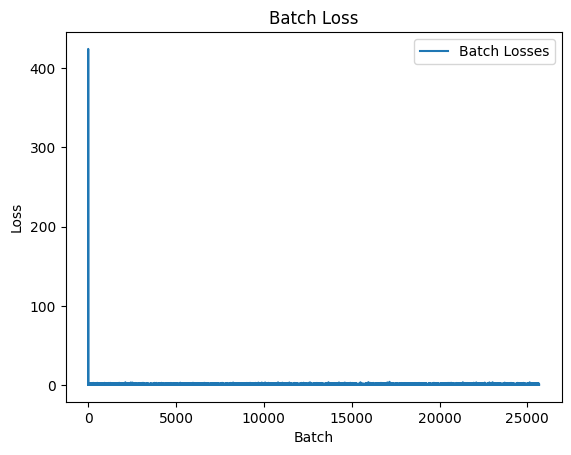

In [24]:
if train:
    df_data = pd.DataFrame({'Batch Losses': trainer.batch_losses})

    sns.lineplot(data=df_data)
    plt.xlabel('Batch')
    plt.ylabel('Loss')
    plt.title('Batch Loss')
    plt.show()

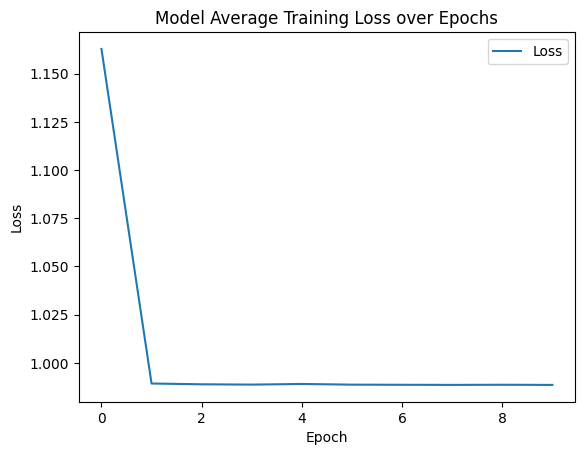

In [25]:
if train:
    df_data = pd.DataFrame({'Loss': trainer.epoch_losses})

    sns.lineplot(data=df_data)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Model Average Training Loss over Epochs')
    plt.show()

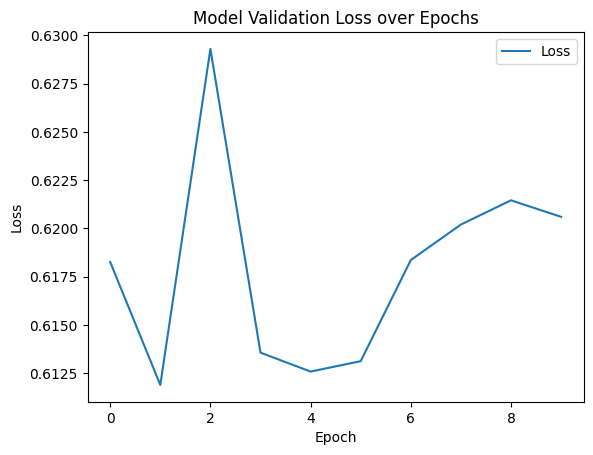

In [26]:
if train:
    df_data = pd.DataFrame({'Loss': trainer.validation_losses})

    sns.lineplot(data=df_data)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Model Validation Loss over Epochs')
    plt.show()

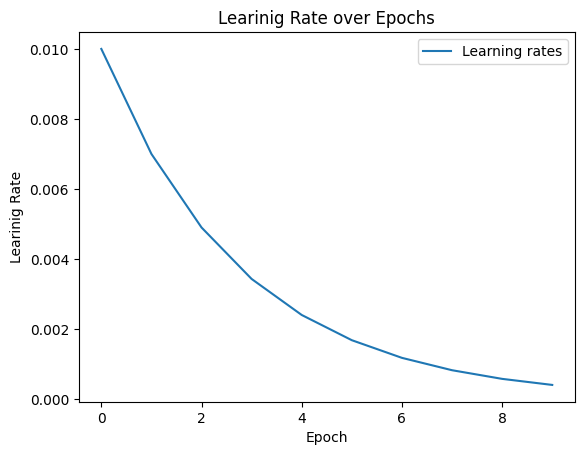

In [27]:
if train:
    df_data = pd.DataFrame({'Learning rates': trainer.learning_rates})

    sns.lineplot(data=df_data)
    plt.xlabel('Epoch')
    plt.ylabel('Learinig Rate')
    plt.title('Learinig Rate over Epochs')
    plt.show()

# Find Optimal Threshold

In [28]:
class DiceThresholdTester:
    
    def __init__(self, model: nn.Module, data_loader: torch.utils.data.DataLoader):
        self.model = model
        self.data_loader = data_loader
        self.cumulative_mask_pred = []
        self.cumulative_mask_true = []
        
    def precalculate_prediction(self) -> None:
        sigmoid = nn.Sigmoid()
        
        for images, mask_true in self.data_loader:
            if torch.cuda.is_available():
                images = images.cuda()

            mask_pred = sigmoid(model.forward(images))

            self.cumulative_mask_pred.append(mask_pred.cpu().detach().numpy())
            self.cumulative_mask_true.append(mask_true.cpu().detach().numpy())
            
        self.cumulative_mask_pred = np.concatenate(self.cumulative_mask_pred, axis=0)
        self.cumulative_mask_true = np.concatenate(self.cumulative_mask_true, axis=0)

        self.cumulative_mask_pred = torch.flatten(torch.from_numpy(self.cumulative_mask_pred))
        self.cumulative_mask_true = torch.flatten(torch.from_numpy(self.cumulative_mask_true))
    
    def test_threshold(self, threshold: float) -> float:
        _dice = Dice(use_sigmoid=False)
        after_threshold = np.zeros(self.cumulative_mask_pred.shape)
        after_threshold[self.cumulative_mask_pred[:] > threshold] = 1
        after_threshold[self.cumulative_mask_pred[:] < threshold] = 0
        after_threshold = torch.flatten(torch.from_numpy(after_threshold))
        return _dice(self.cumulative_mask_true, after_threshold).item()

In [29]:
dice_threshold_tester = DiceThresholdTester(model, data_loader_validation)
dice_threshold_tester.precalculate_prediction()

In [30]:
thresholds_to_test = [round(x * 0.01, 2) for x in range(101)]

optim_threshold = 0.975
best_dice_score = -1

thresholds = []
dice_scores = []

for t in thresholds_to_test:
    dice_score = dice_threshold_tester.test_threshold(t)
    if dice_score > best_dice_score:
        best_dice_score = dice_score
        optim_threshold = t
    
    thresholds.append(t)
    dice_scores.append(dice_score)
    
print(f'Best Threshold: {optim_threshold} with dice: {best_dice_score}')
df_threshold_data = pd.DataFrame({'Threshold': thresholds, 'Dice Score': dice_scores})

Best Threshold: 0.0 with dice: 0.003618169532816978


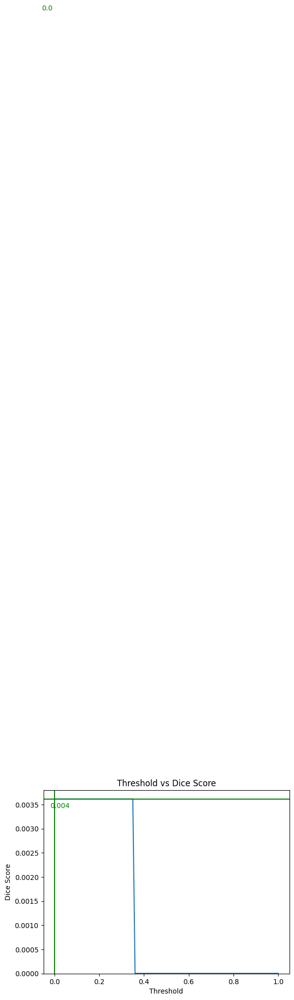

In [31]:
sns.lineplot(data=df_threshold_data, x='Threshold', y='Dice Score')
plt.axhline(y=best_dice_score, color='green')
plt.axvline(x=optim_threshold, color='green')
plt.text(-0.02, best_dice_score * 0.96, f'{best_dice_score:.3f}', va='center', ha='left', color='green')
plt.text(optim_threshold - 0.01, 0.02, f'{optim_threshold}', va='center', ha='right', color='green')
plt.ylim(bottom=0)
plt.title('Threshold vs Dice Score')
plt.show()

# Preview Models Predictions on Validation

Saved plot: plot_output/batch_1_img_1.png


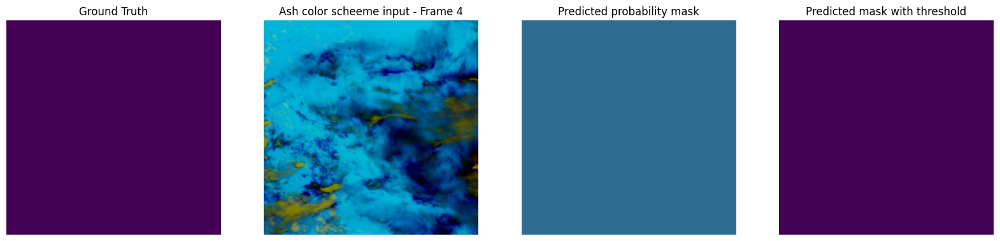

Saved plot: plot_output/batch_1_img_2.png


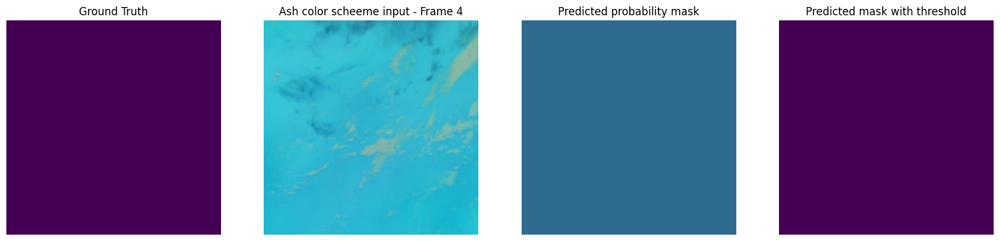

Saved plot: plot_output/batch_1_img_3.png


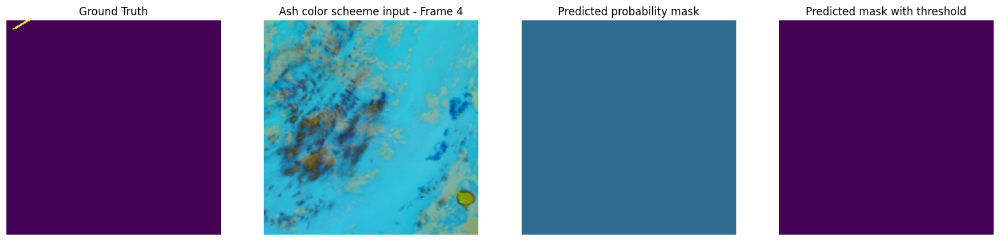

Saved plot: plot_output/batch_1_img_4.png


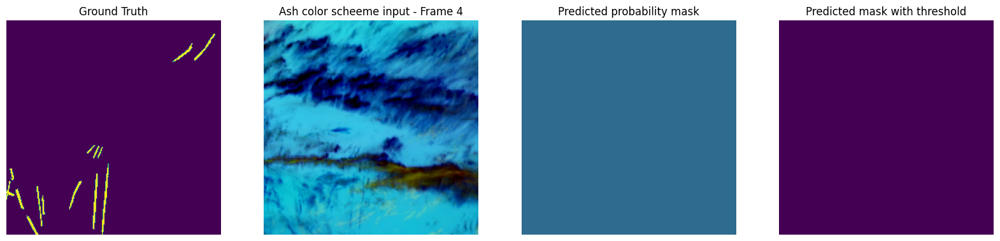

Saved plot: plot_output/batch_1_img_5.png


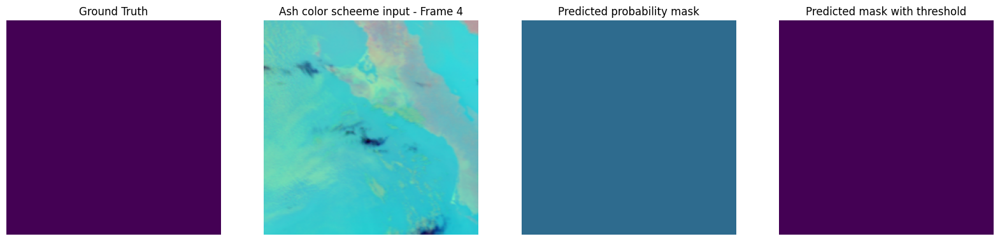

Saved plot: plot_output/batch_1_img_6.png


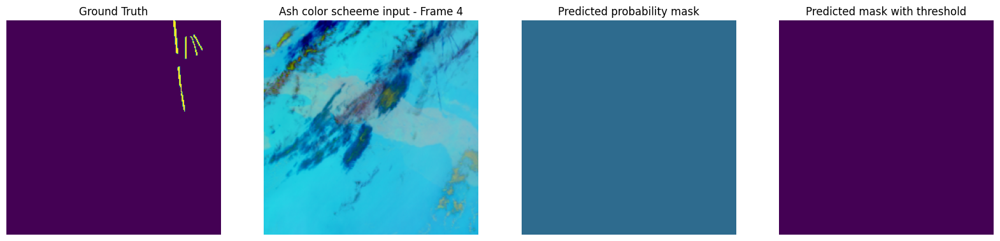

Saved plot: plot_output/batch_1_img_7.png


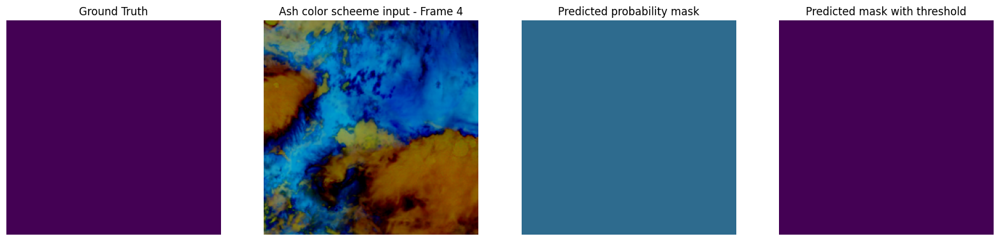

Saved plot: plot_output/batch_1_img_8.png


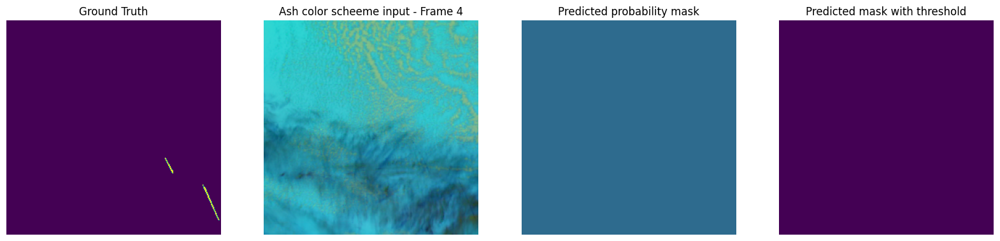

Saved plot: plot_output/batch_2_img_1.png


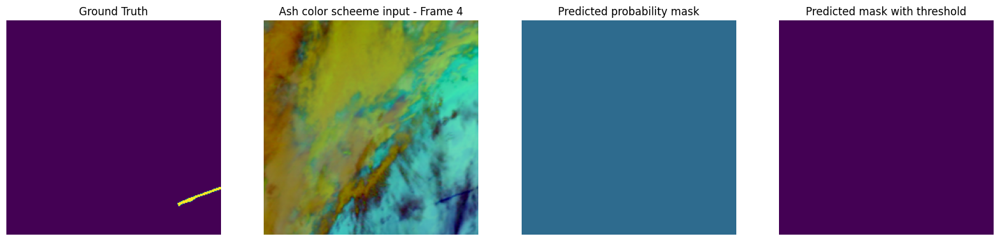

Saved plot: plot_output/batch_2_img_2.png


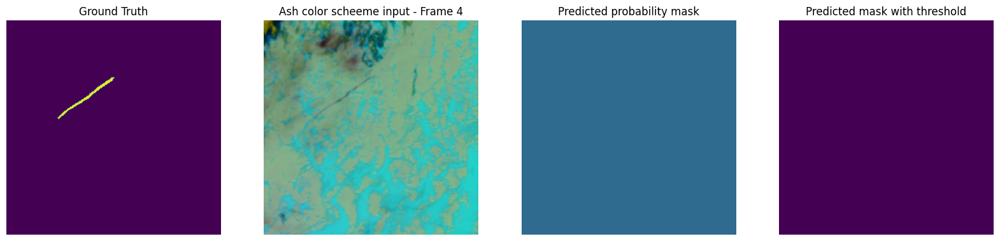

Saved plot: plot_output/batch_2_img_3.png


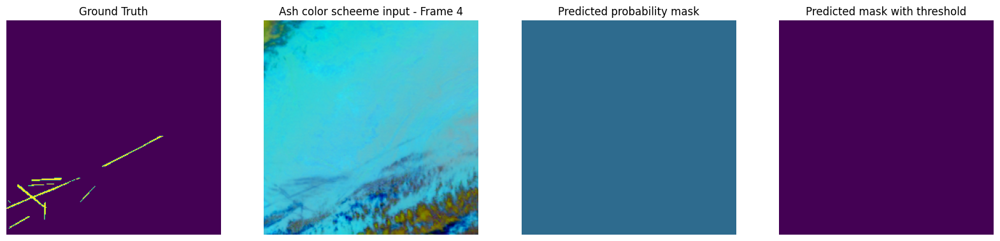

Saved plot: plot_output/batch_2_img_4.png


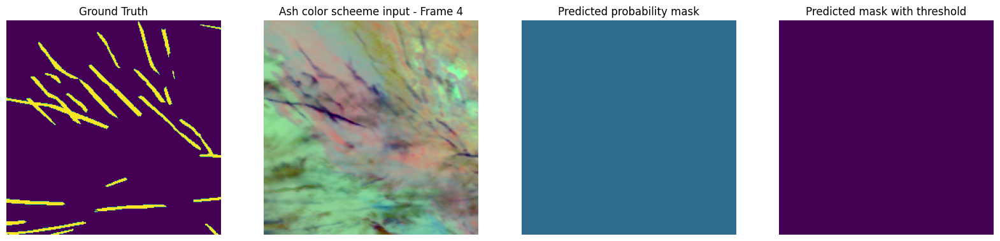

Saved plot: plot_output/batch_2_img_5.png


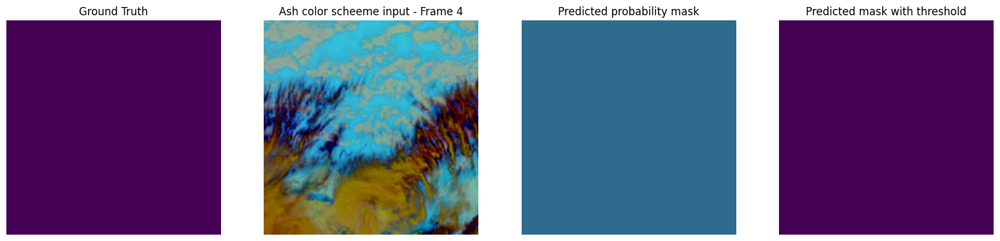

Saved plot: plot_output/batch_2_img_6.png


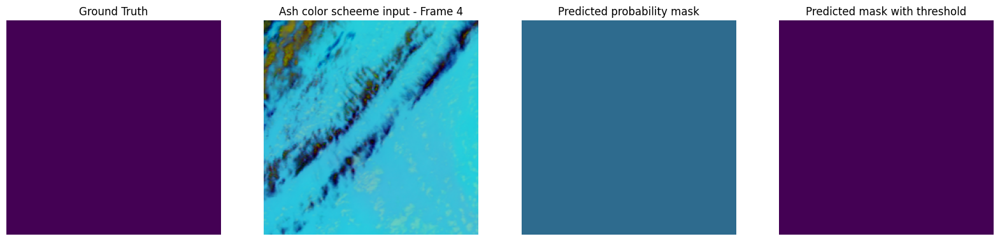

Saved plot: plot_output/batch_2_img_7.png


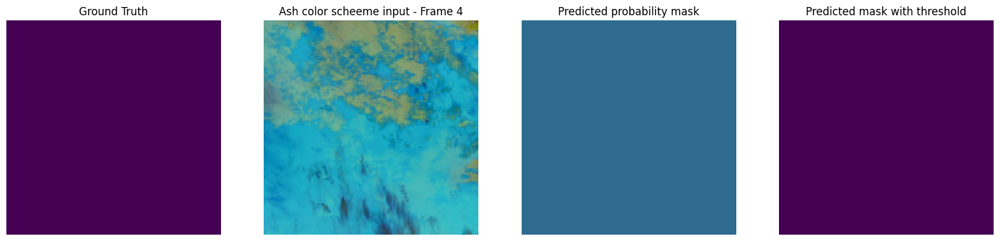

Saved plot: plot_output/batch_2_img_8.png


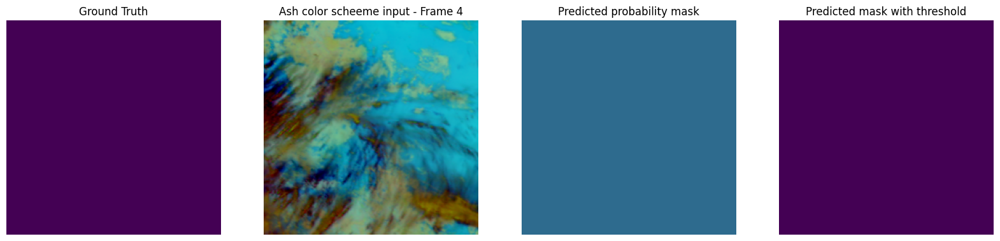

Saved plot: plot_output/batch_3_img_1.png


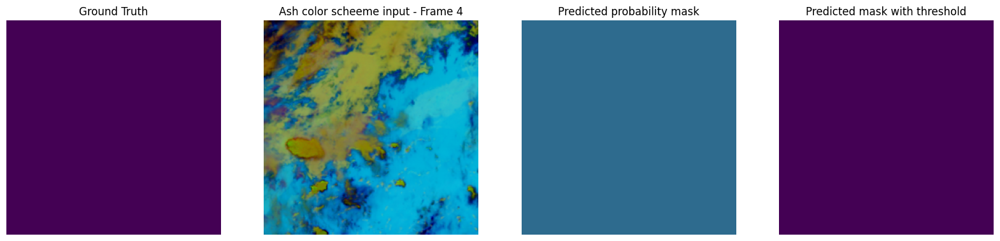

Saved plot: plot_output/batch_3_img_2.png


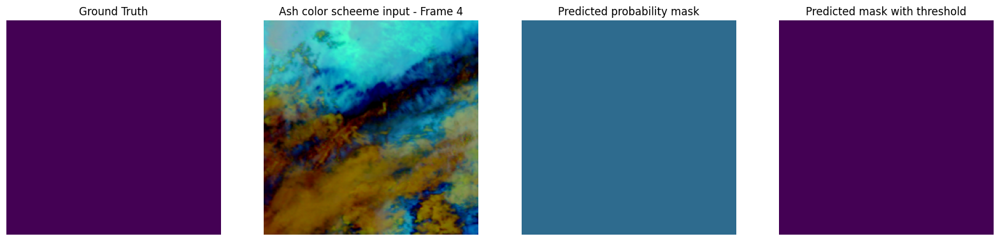

Saved plot: plot_output/batch_3_img_3.png


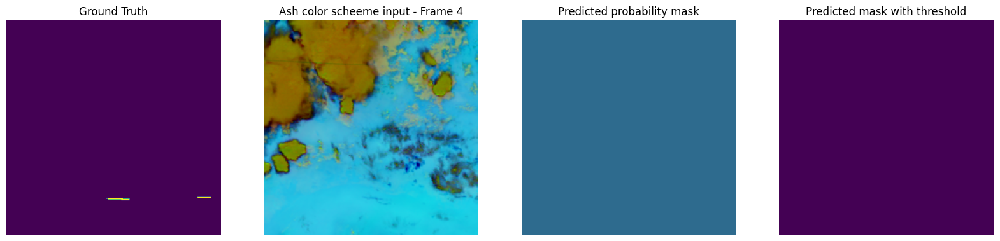

Saved plot: plot_output/batch_3_img_4.png


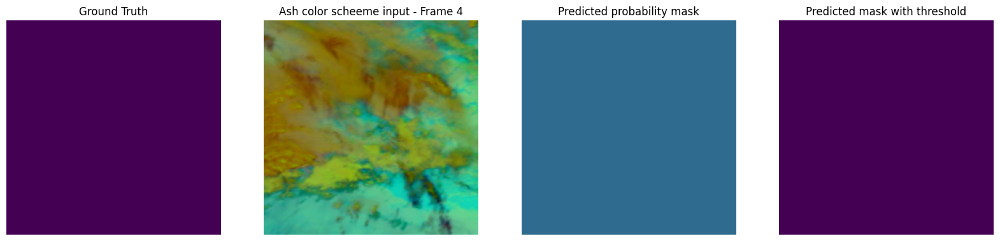

Saved plot: plot_output/batch_3_img_5.png


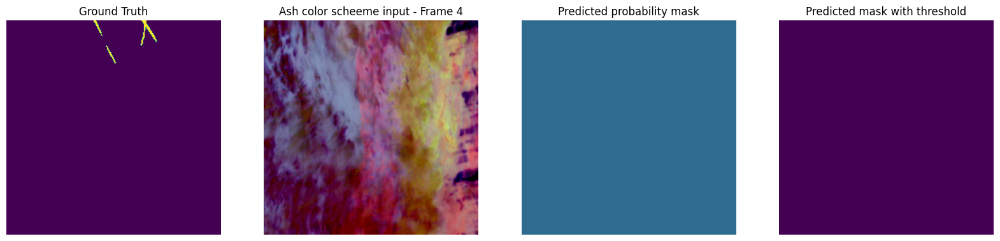

Saved plot: plot_output/batch_3_img_6.png


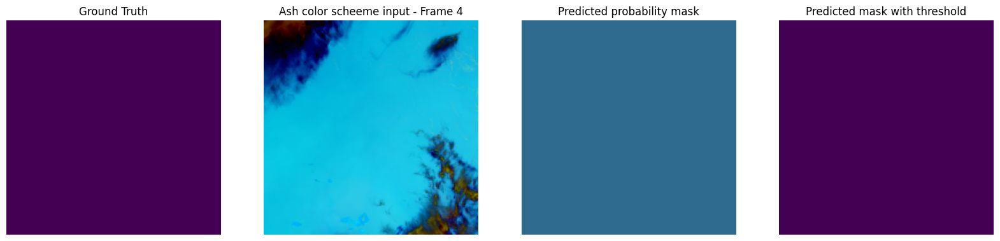

Saved plot: plot_output/batch_3_img_7.png


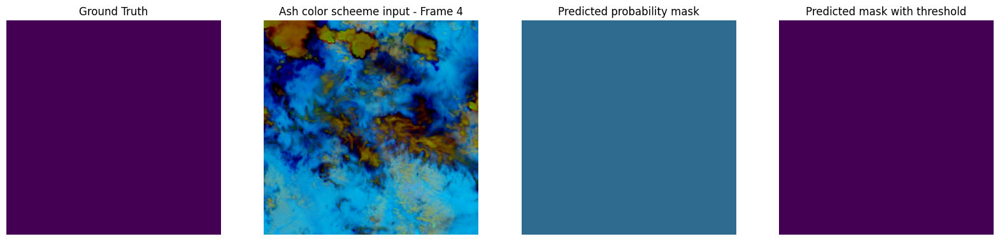

Saved plot: plot_output/batch_3_img_8.png


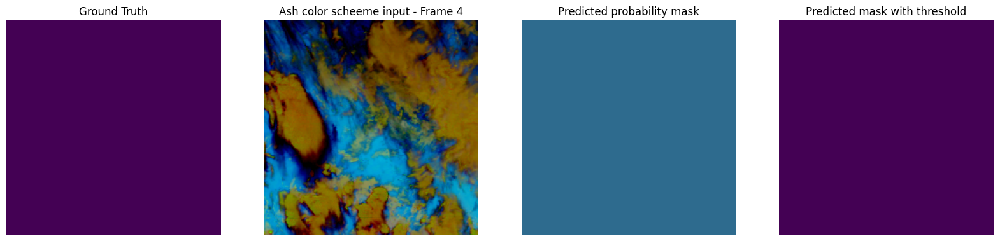

Saved plot: plot_output/batch_4_img_1.png


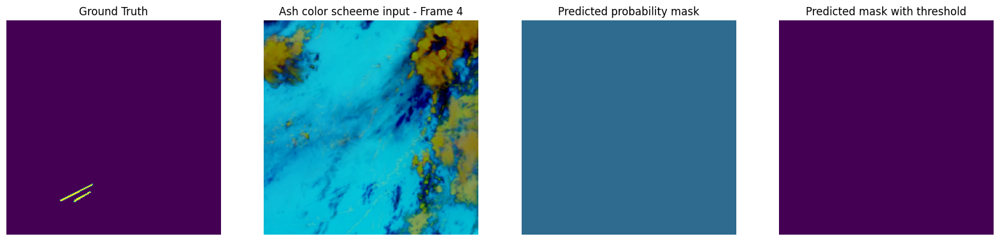

Saved plot: plot_output/batch_4_img_2.png


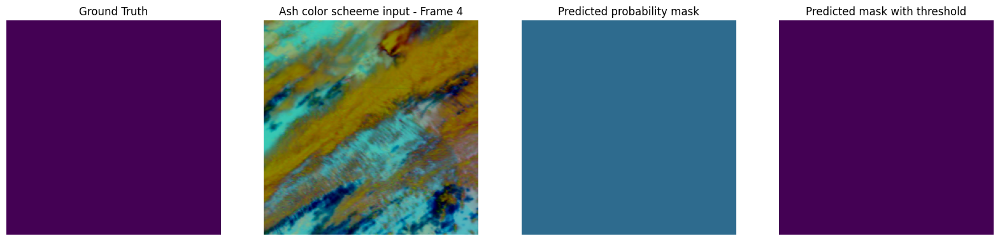

Saved plot: plot_output/batch_4_img_3.png


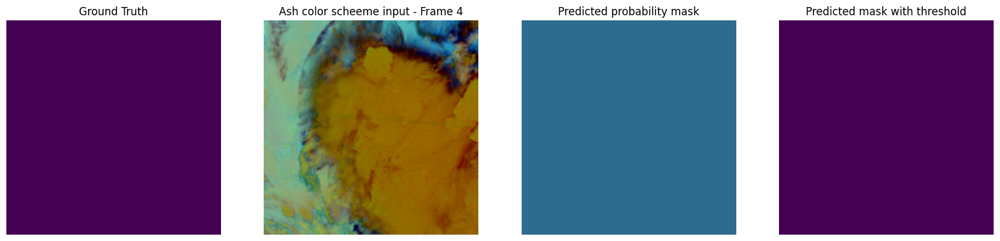

Saved plot: plot_output/batch_4_img_4.png


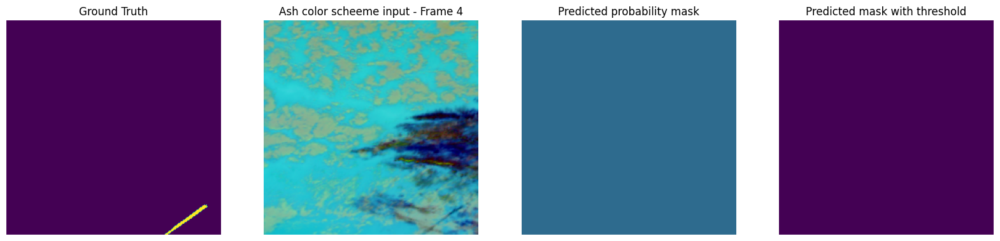

Saved plot: plot_output/batch_4_img_5.png


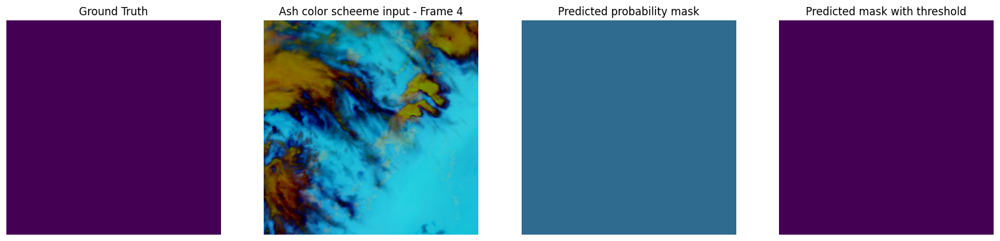

Saved plot: plot_output/batch_4_img_6.png


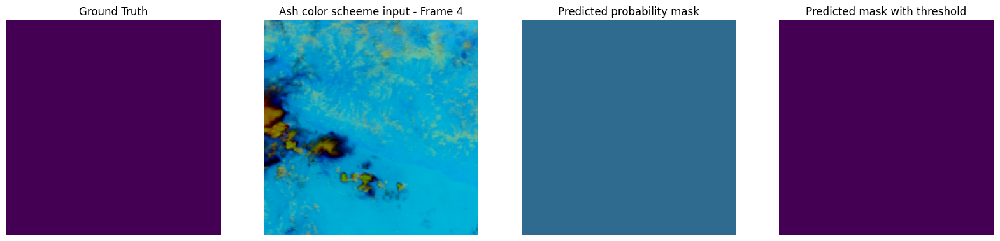

Saved plot: plot_output/batch_4_img_7.png


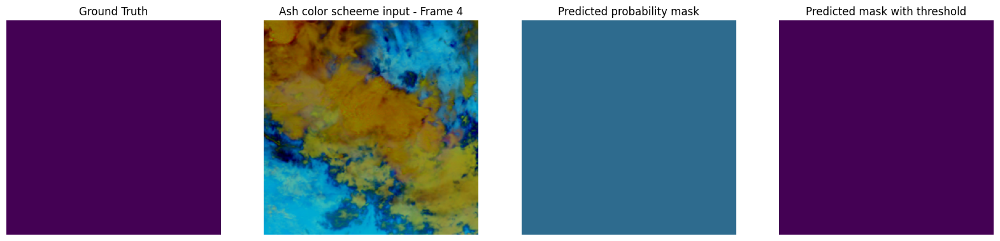

Saved plot: plot_output/batch_4_img_8.png


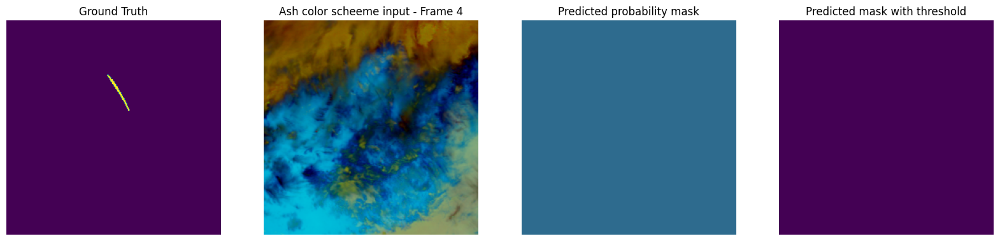

In [32]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

batches_to_show = 4
model.eval()

for i, data in enumerate(data_loader_validation):
    images, mask = data
    
    # Predict mask for this instance
    if torch.cuda.is_available():
        images = images.cuda()
    predicated_mask = sigmoid(model.forward(images[:, :, :, :]).cpu().detach().numpy())
    
    # Apply threshold
    predicated_mask_with_threshold = np.zeros((images.shape[0], 256, 256))
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] < optim_threshold] = 0
    predicated_mask_with_threshold[predicated_mask[:, 0, :, :] > optim_threshold] = 1
    
    images = images.cpu()
        
    for img_num in range(0, images.shape[0]):
        fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,10))
        axes = axes.flatten()
        
        # Show groud trought 
        axes[0].imshow(mask[img_num, 0, :, :])
        axes[0].axis('off')
        axes[0].set_title('Ground Truth')
        
        # Show ash color scheme input image
        axes[1].imshow( np.concatenate(
            (
            np.expand_dims(images[img_num, 4, :, :], axis=2),
            np.expand_dims(images[img_num, 12, :, :], axis=2),
            np.expand_dims(images[img_num, 20, :, :], axis=2)
        ), axis=2))
        axes[1].axis('off')
        axes[1].set_title('Ash color scheeme input - Frame 4')

        # Show predicted mask
        axes[2].imshow(predicated_mask[img_num, 0, :, :], vmin=0, vmax=1)
        axes[2].axis('off')
        axes[2].set_title('Predicted probability mask')

        # Show predicted mask after threshold
        axes[3].imshow(predicated_mask_with_threshold[img_num, :, :])
        axes[3].axis('off')
        axes[3].set_title('Predicted mask with threshold')

        output_dir = "plot_output"
        os.makedirs(output_dir, exist_ok=True)

        # Save the plot
        plot_filename = os.path.join(output_dir, f"batch_{i+1}_img_{img_num+1}.png")
        plt.savefig(plot_filename)
        print(f"Saved plot: {plot_filename}")        
        
        plt.show()
    
    if i + 1 >= batches_to_show:
        break